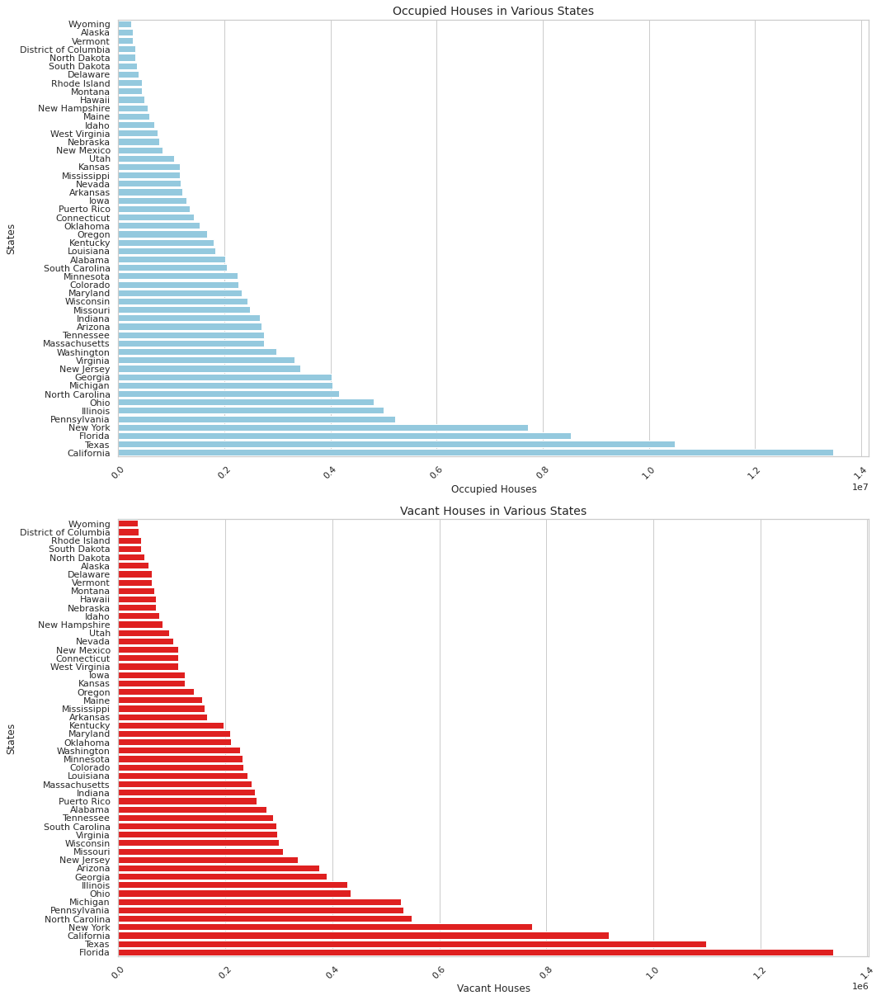

In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('DECENNIALPL2020.H1-2024-03-07T035737.csv')

# Define the row indices for Occupied Houses and Vacant Houses
occupied_index = 1
vacant_index = 2

# Extract data for occupied houses
occupied_data = df.iloc[occupied_index]
occupied_data_int = pd.to_numeric(occupied_data.str.replace(',', ''), errors='coerce')
occupied_data_int.dropna(inplace=True)
sorted_occupied = occupied_data_int.sort_values()

# Extract data for vacant houses
vacant_data = df.iloc[vacant_index]
vacant_data_int = pd.to_numeric(vacant_data.str.replace(',', ''), errors='coerce')
vacant_data_int.dropna(inplace=True)
sorted_vacant = vacant_data_int.sort_values()

# Set style
sns.set(style="whitegrid")

# Set the figure size
plt.figure(figsize=(15, 17))

# Plotting using seaborn
plt.subplot(2, 1, 1)
sns.barplot(x=sorted_occupied.values, y=sorted_occupied.index, color='skyblue')
plt.title('Occupied Houses in Various States', fontsize=14)
plt.xlabel('Occupied Houses', fontsize=12)
plt.ylabel('States', fontsize=12)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.subplot(2, 1, 2)
sns.barplot(x=sorted_vacant.values, y=sorted_vacant.index, color='red')
plt.title('Vacant Houses in Various States', fontsize=14)
plt.xlabel('Vacant Houses', fontsize=12)
plt.ylabel('States', fontsize=12)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()

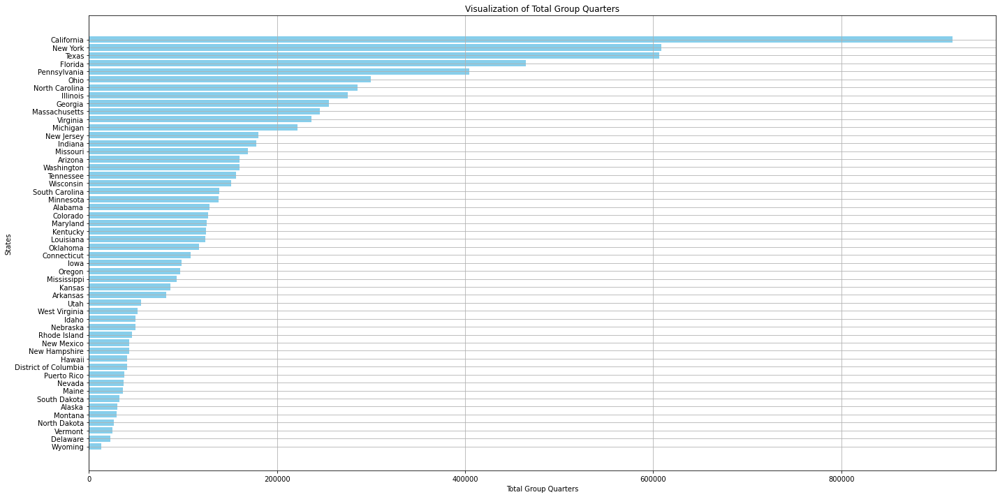

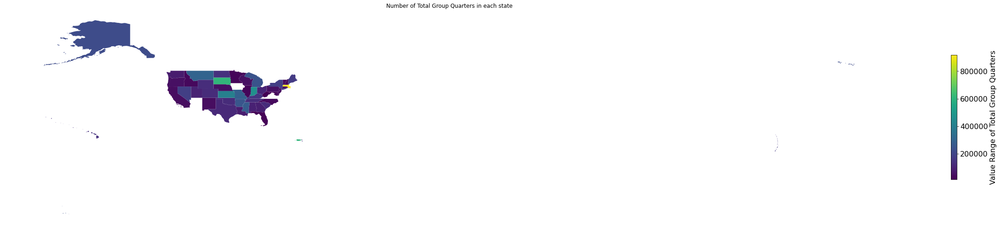

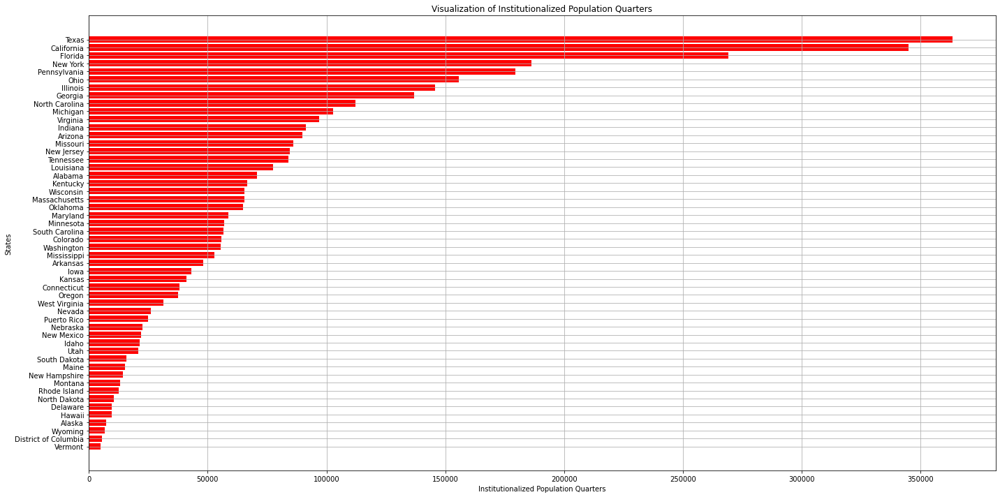

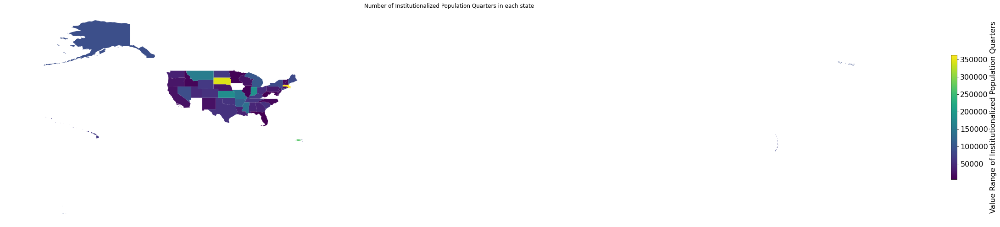

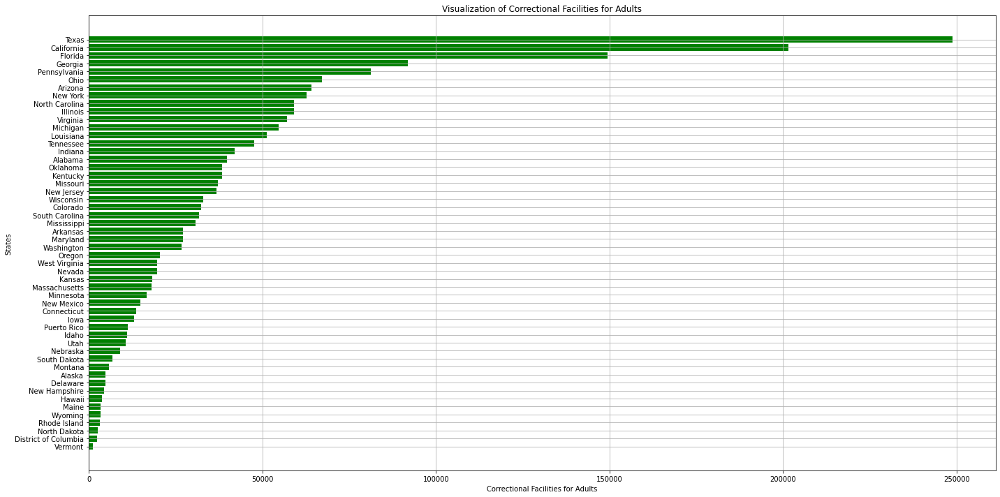

...

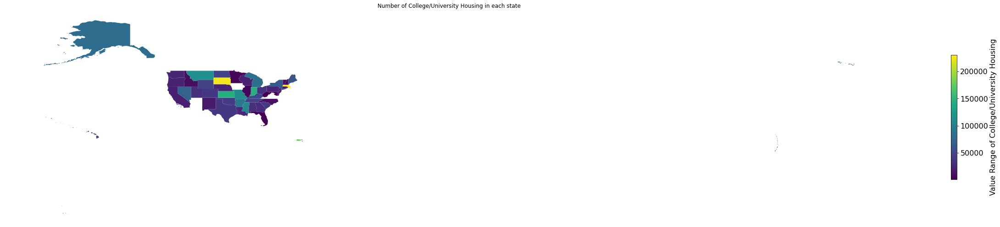

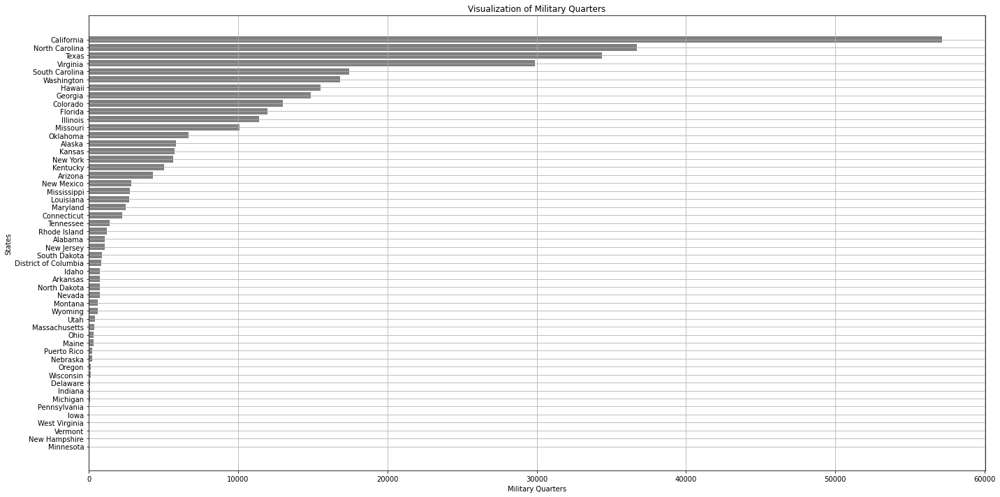

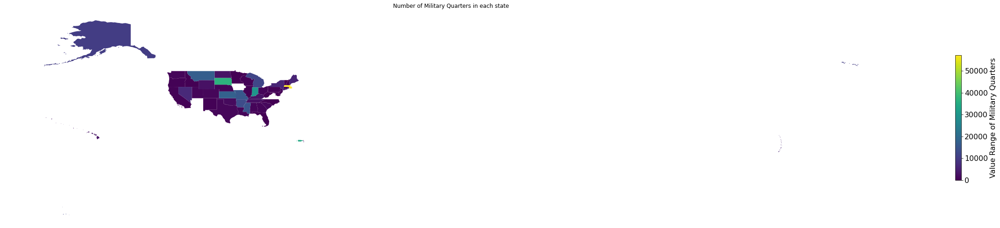

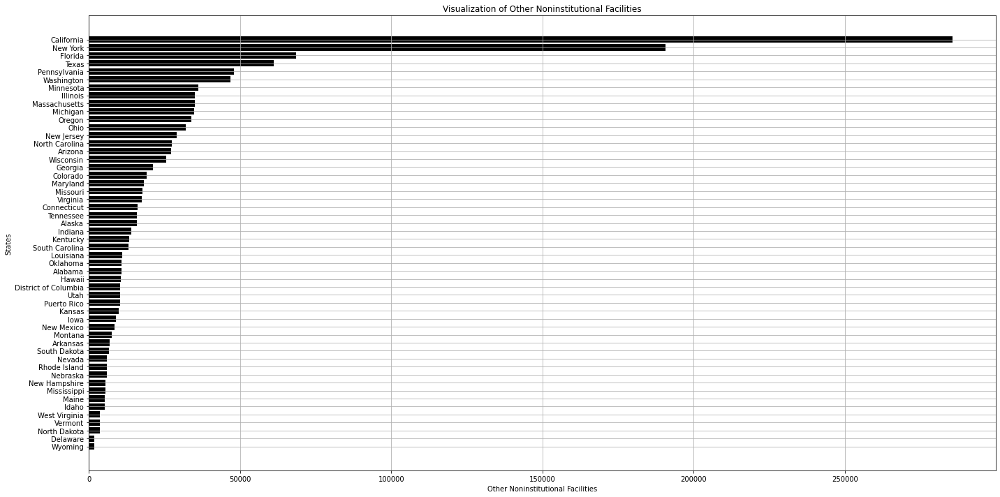

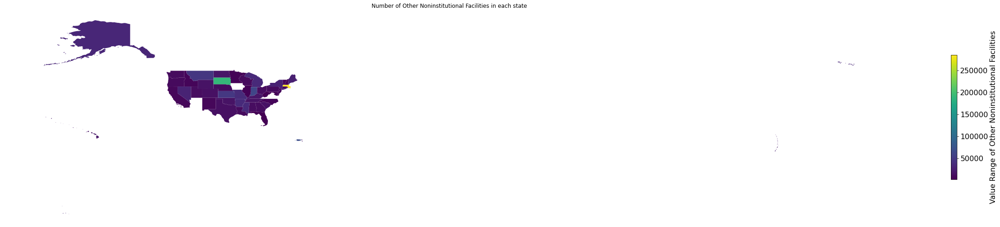

In [2]:
!pip install geopandas
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

df = pd.read_csv('DECENNIALPL2020.P5-2024-03-07T035927.csv')

# Define the row indices for different categories
categories = [
    "Total Group Quarters", "Institutionalized Population Quarters",
    "Correctional Facilities for Adults", "Juvenile Facilities",
    "Nursing Facilities", "Other Institutional Facilities",
    "Non-Institutionalized Population Quarters", "College/University Housing",
    "Military Quarters", "Other Noninstitutional Facilities"
]

# Define colors for each category
colors = ['skyblue', 'red', 'green', 'yellow', 'purple', 'orange', 
          'cyan', 'magenta', 'gray', 'black']

us_states = gpd.read_file('tl_2023_us_state.shp')

for i, category in enumerate(categories):
    row_data = df.iloc[i]
    states = row_data.index[1:]  # Remove the first entry in states
    values = row_data.values[1:]  # Remove the first entry in values
    row_data_int = []
    for value in values:
        try:
            row_data_int.append(int(value.replace(',', '')))
        except ValueError:
            pass
    sorted_states, sorted_values = zip(*sorted(zip(states, row_data_int), key=lambda x: x[1]))
    
    plt.figure(figsize=(20, 10))
    plt.barh(sorted_states, sorted_values, color=colors[i])
    plt.title(f'Visualization of {category}')
    plt.xlabel(category)
    plt.ylabel('States')
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Plot the Shape File Data
    state_data = {
        'State': sorted_states,
        'Value': sorted_values
    }
    
    state_df = pd.DataFrame(state_data)
    
    merged_data = us_states.merge(state_df, left_index=True, right_index=True)

    # Define the color map and color limits
    cmap = 'viridis'
    vmin = merged_data['Value'].min()
    vmax = merged_data['Value'].max()

    # Plot the map
    fig, ax = plt.subplots(1, 1, figsize=(50, 50))
    merged_data.plot(column='Value', cmap=cmap, linewidth = 0.8, legend=False, ax=ax, vmin=vmin, vmax=vmax)

    # Customize plot title
    ax.set_title(f'Number of {category} in each state')

    # Hide axis
    ax.axis('off')

    # Add colorbar legend
    norm = Normalize(vmin=vmin, vmax=vmax)
    sm = ScalarMappable(norm=norm, cmap=cmap)
    cbar = plt.colorbar(sm, ax=ax, shrink=0.1)
    cbar.set_label(f'Value Range of {category}', fontsize=16)
    cbar.ax.tick_params(labelsize=16)
    
    # Adjust layout to remove the gap
    fig.subplots_adjust(right=0.8)
    
    plt.show()

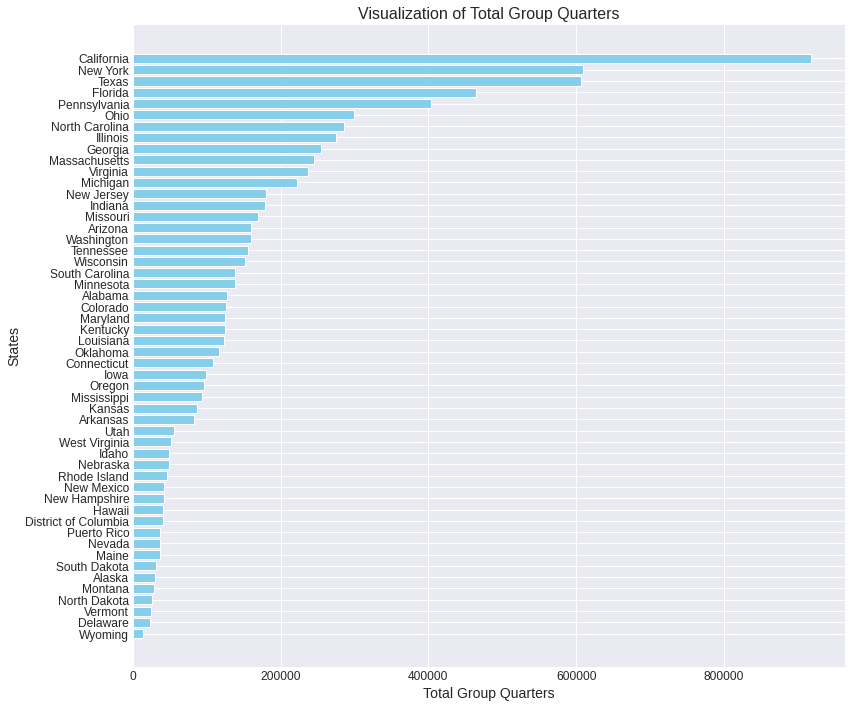

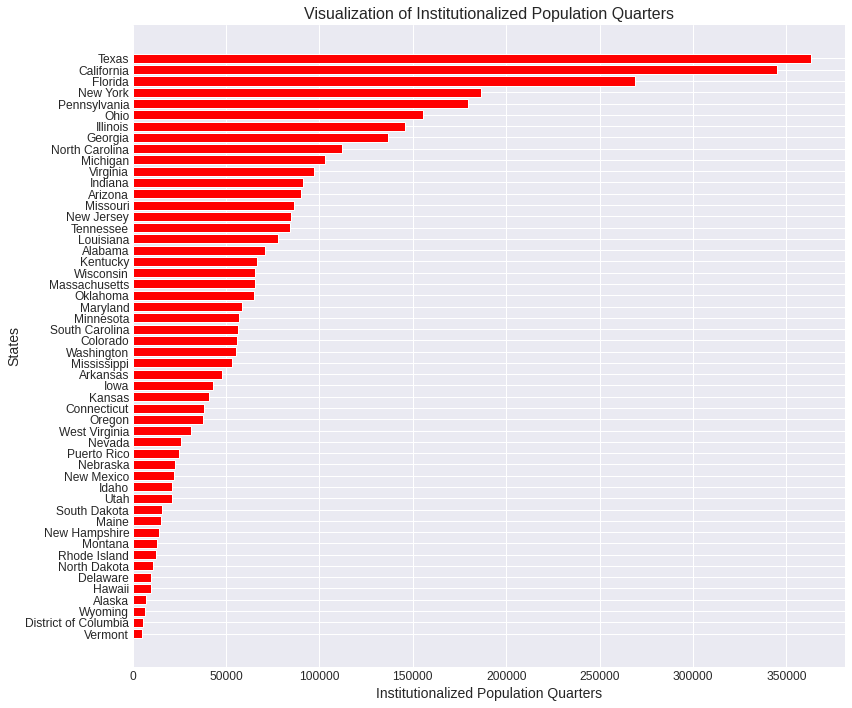

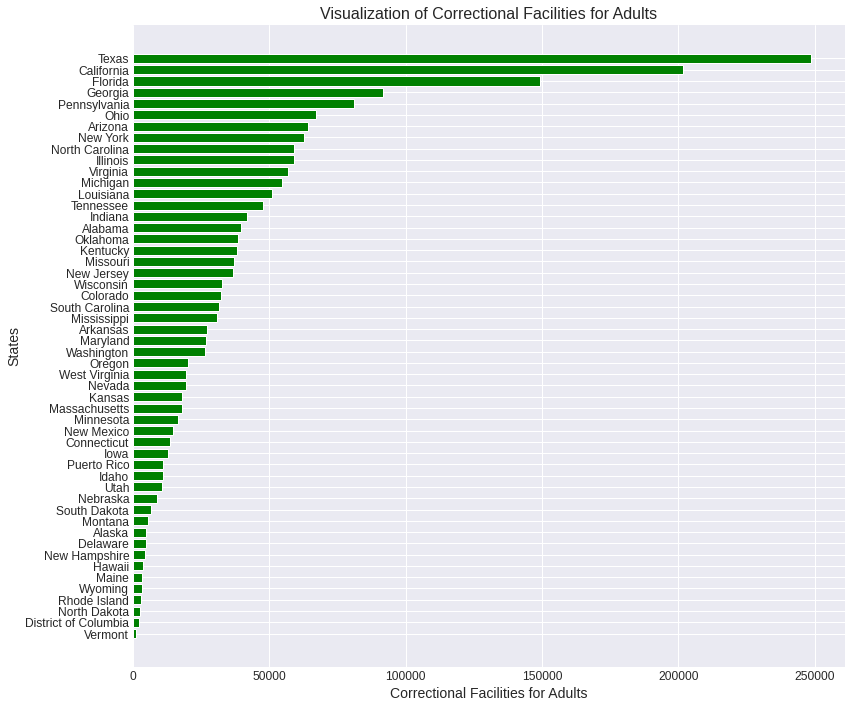

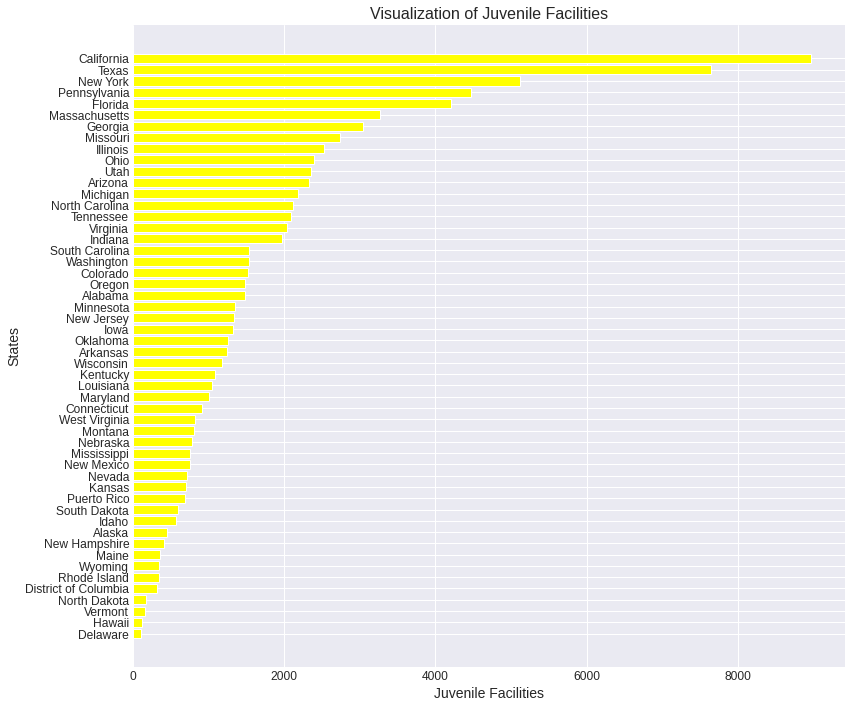

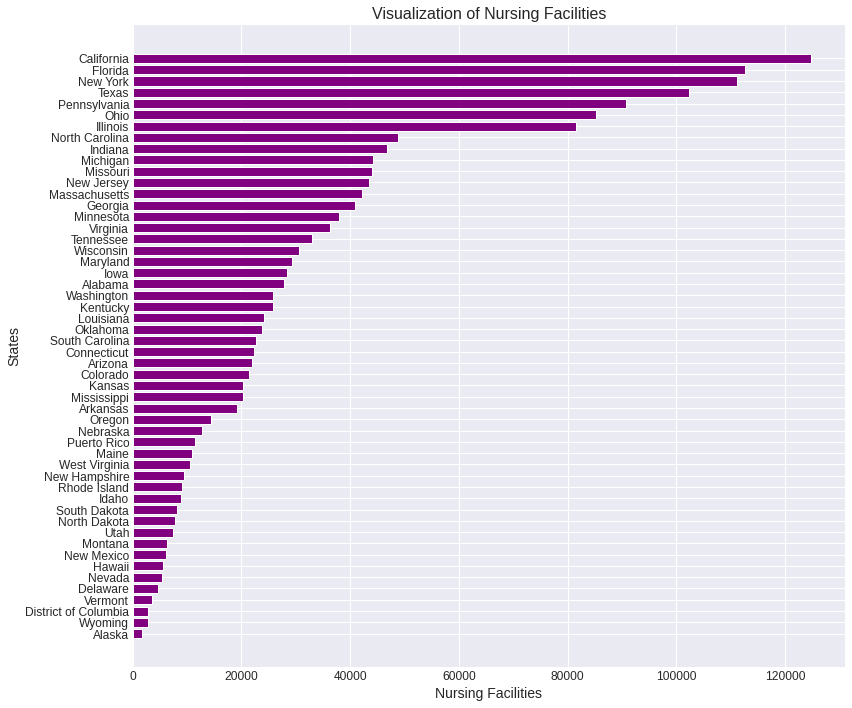

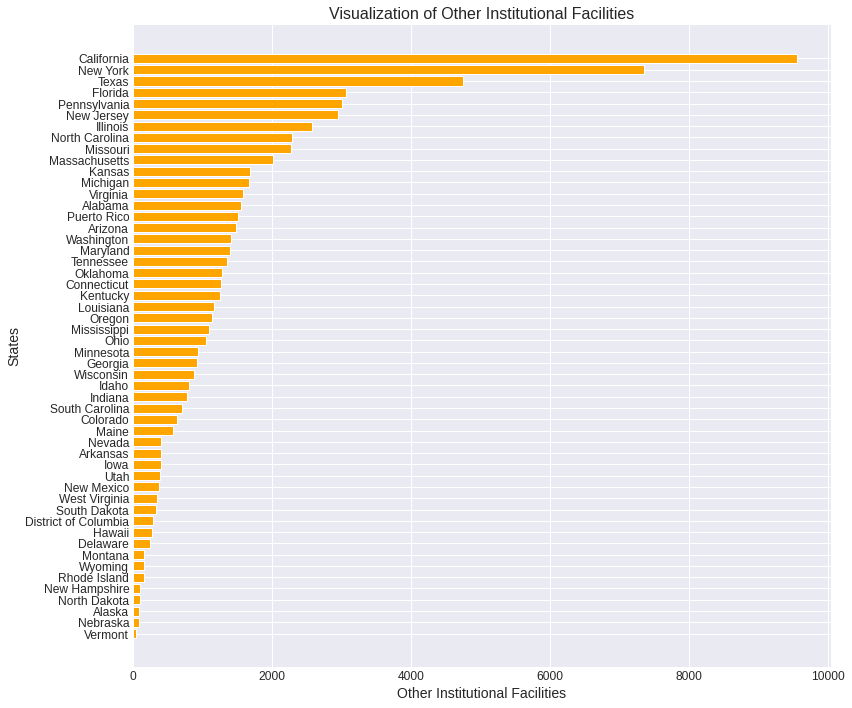

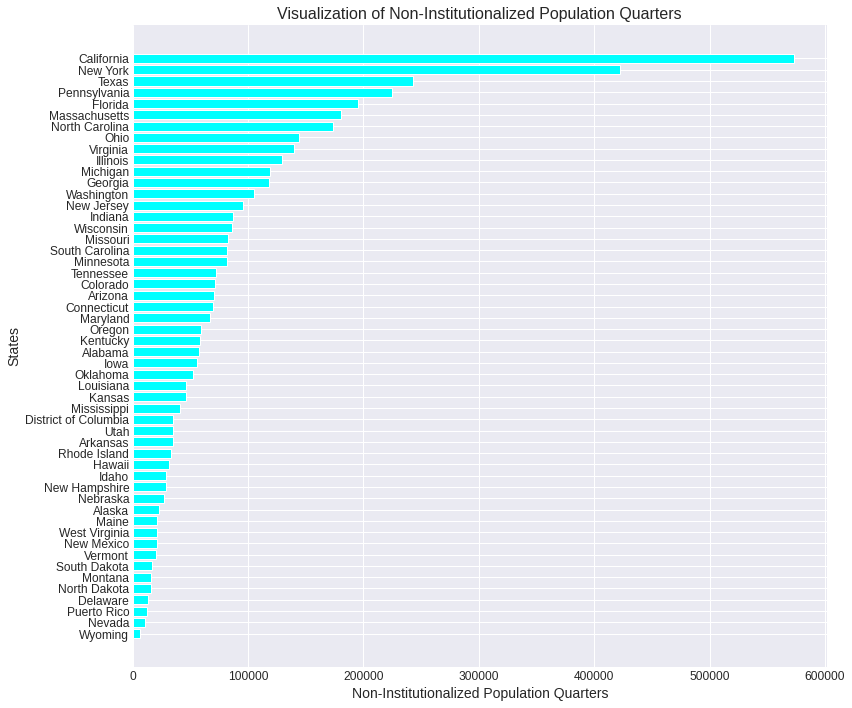

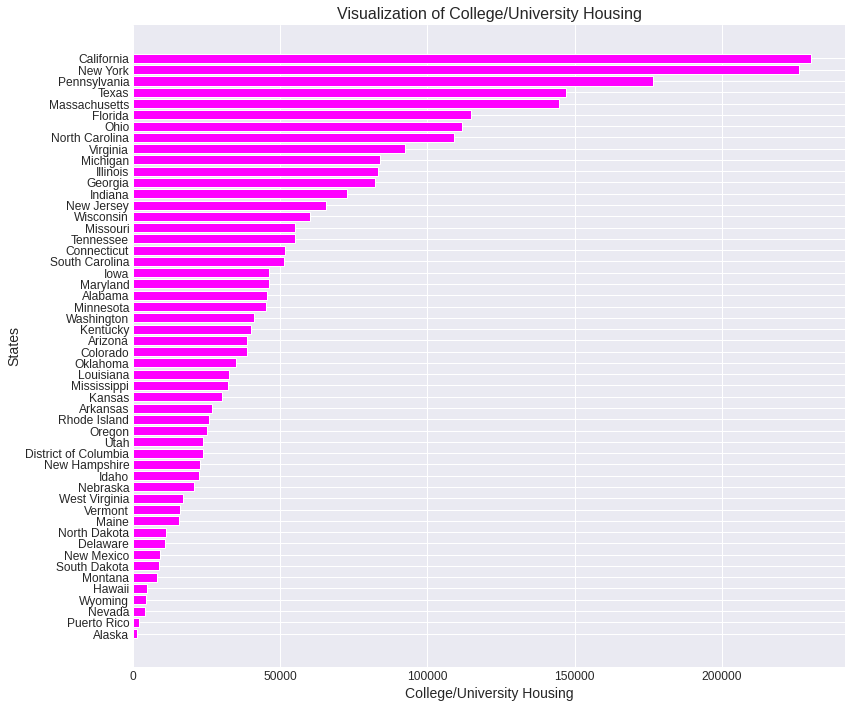

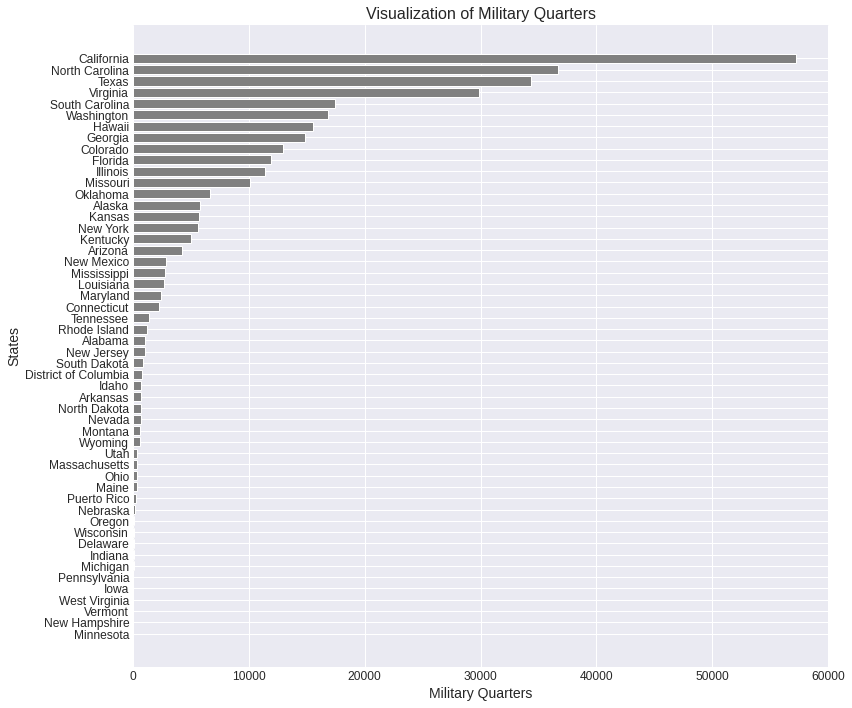

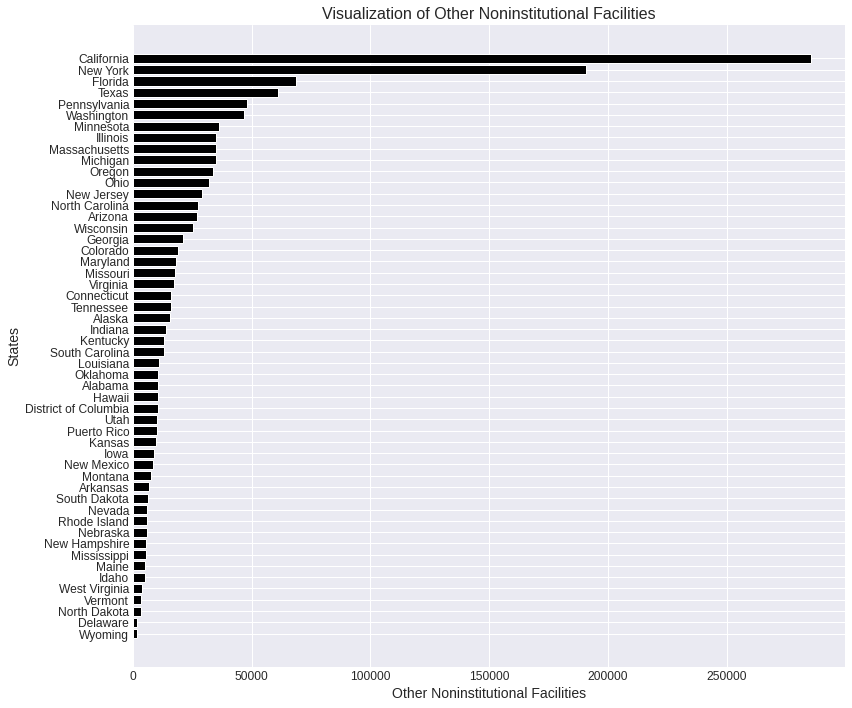

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('DECENNIALPL2020.P5-2024-03-07T035927.csv')

# Define the row indices for different categories
categories = [
    "Total Group Quarters", "Institutionalized Population Quarters",
    "Correctional Facilities for Adults", "Juvenile Facilities",
    "Nursing Facilities", "Other Institutional Facilities",
    "Non-Institutionalized Population Quarters", "College/University Housing",
    "Military Quarters", "Other Noninstitutional Facilities"
]

# Define colors for each category
colors = ['skyblue', 'red', 'green', 'yellow', 'purple', 'orange', 
          'cyan', 'magenta', 'gray', 'black']

# Set the style
plt.style.use('seaborn-darkgrid')

# Plotting for each category
for i, category in enumerate(categories):
    row_data = df.iloc[i]
    states = row_data.index[1:]  # Remove the first entry in states
    values = row_data.values[1:]  # Remove the first entry in values
    row_data_int = []
    for value in values:
        try:
            row_data_int.append(int(value.replace(',', '')))
        except ValueError:
            pass
    sorted_states, sorted_values = zip(*sorted(zip(states, row_data_int), key=lambda x: x[1]))
    
    # Plotting
    plt.figure(figsize=(12, 10))
    plt.barh(sorted_states, sorted_values, color=colors[i])
    plt.title(f'Visualization of {category}', fontsize=16)
    plt.xlabel(category, fontsize=14)
    plt.ylabel('States', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

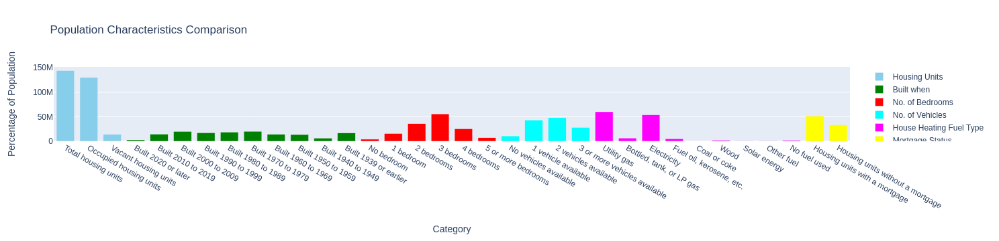

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

# Load data
file_path = "ACSDP1Y2022.DP04-2024-03-07T074546.xlsx"
df = pd.read_excel(file_path, sheet_name="Data")

# Define subsets of the data
subset_df1 = df.iloc[2:5, [0, 1]]  # No of housing units
subset_df2 = df.iloc[20:30, [0, 1]]  # Built when
subset_df3 = df.iloc[44:50, [0, 1]]  # No. of bedrooms
subset_df4 = df.iloc[66:70, [0, 1]]  # No. of Vehicles
subset_df5 = df.iloc[72:81, [0, 1]]  # House Heating Fuel Type
subset_df6 = df.iloc[104:106, [0, 1]]  # Mortgage Status

# Clean data: remove commas and convert to int
subset_df1.iloc[:, 1] = subset_df1.iloc[:, 1].str.replace(',', '').astype(int)
subset_df2.iloc[:, 1] = subset_df2.iloc[:, 1].str.replace(',', '').astype(int)
subset_df3.iloc[:, 1] = subset_df3.iloc[:, 1].str.replace(',', '').astype(int)
subset_df4.iloc[:, 1] = subset_df4.iloc[:, 1].str.replace(',', '').astype(int)
subset_df5.iloc[:, 1] = subset_df5.iloc[:, 1].str.replace(',', '').astype(int)
subset_df6.iloc[:, 1] = subset_df6.iloc[:, 1].str.replace(',', '').astype(int)

# Set seaborn style
sns.set(style="whitegrid")

# Initialize subplot grid
fig = go.Figure()

# Plotting each subplot
fig.add_trace(go.Bar(x=subset_df1.iloc[:, 0], y=subset_df1.iloc[:, 1], name='Housing Units', marker_color='skyblue'))
fig.add_trace(go.Bar(x=subset_df2.iloc[:, 0], y=subset_df2.iloc[:, 1], name='Built when', marker_color='green'))
fig.add_trace(go.Bar(x=subset_df3.iloc[:, 0], y=subset_df3.iloc[:, 1], name='No. of Bedrooms', marker_color='red'))
fig.add_trace(go.Bar(x=subset_df4.iloc[:, 0], y=subset_df4.iloc[:, 1], name='No. of Vehicles', marker_color='cyan'))
fig.add_trace(go.Bar(x=subset_df5.iloc[:, 0], y=subset_df5.iloc[:, 1], name='House Heating Fuel Type', marker_color='magenta'))
fig.add_trace(go.Bar(x=subset_df6.iloc[:, 0], y=subset_df6.iloc[:, 1], name='Mortgage Status', marker_color='yellow'))

# Update layout
fig.update_layout(
    title='Population Characteristics Comparison',
    xaxis_title='Category',
    yaxis_title='Percentage of Population',
    barmode='group',
    bargap=0.15,
    bargroupgap=0.1,
    height=800
)

# Show plot
fig.show()

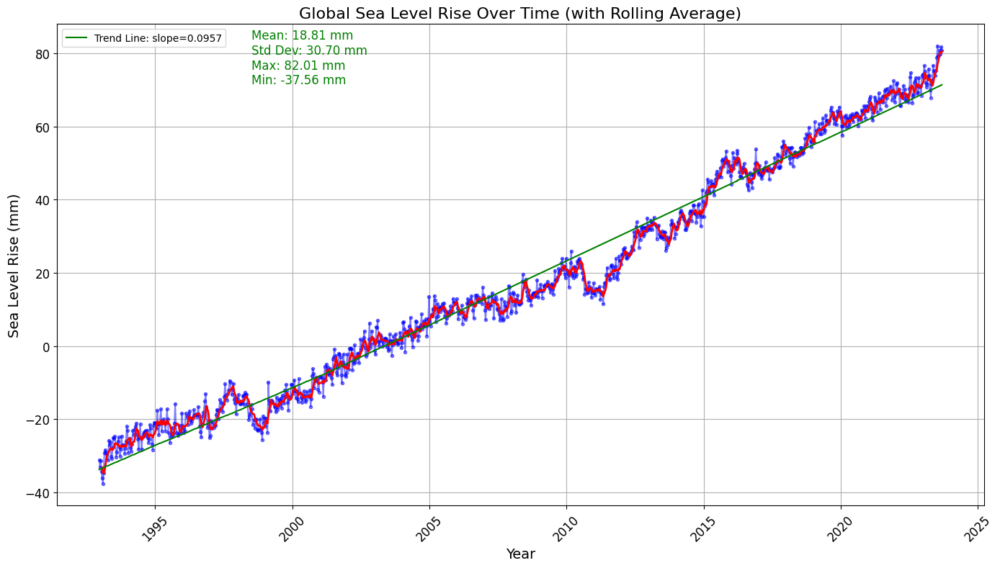

From the provided graph, which tracks global sea level rise over time,
a clear upward trend can be observed. This suggests an increase in the global sea
level over the years. The plotted data appears to start around the early 1990s and
continues up to the mid-2020s. The annotations provide additional information,
indicating that the mean sea level rise is 18.81 mm, with a standard deviation of
30.70 mm. The maximum recorded rise is 82.01 mm, while the minimum is -37.56 mm.


In [7]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Attempting to load the data again with a more explicit approach
data = pd.read_csv('gmsl_2023rel2_seasons_rmvd.txt', delim_whitespace=True)

# Assuming the first two columns are 'Date' and 'Measurement', we explicitly select them
data = data.iloc[:, :2]
data.columns = ['Date', 'Measurement']

# Calculate some statistics
mean_value = data['Measurement'].mean()
std_dev = data['Measurement'].std()
max_value = data['Measurement'].max()
min_value = data['Measurement'].min()

# Rolling average (window size can be adjusted)
rolling_window = 5  # for example, a 5-year rolling average
data['Measurement_Smooth'] = data['Measurement'].rolling(window=rolling_window).mean()

# Calculate linear regression for trend
slope, intercept, r_value, p_value, std_err = linregress(data.index, data['Measurement'])

# Plot
plt.figure(figsize=(14, 8), dpi=100)
plt.plot(data['Date'], data['Measurement'], marker='.', linestyle='-', color='b', alpha=0.5)
plt.plot(data['Date'], data['Measurement_Smooth'], marker='', linestyle='-', color='red', linewidth=2)

# Add trend line
plt.plot(data['Date'], intercept + slope * data.index, 'g', label=f'Trend Line: slope={slope:.4f}')

# Annotate the statistics
plt.text(0.21, 0.99, f'Mean: {mean_value:.2f} mm\nStd Dev: {std_dev:.2f} mm\nMax: {max_value:.2f} mm\nMin: {min_value:.2f} mm',
         verticalalignment='top', horizontalalignment='left',
         transform=plt.gca().transAxes,
         color='green', fontsize=12)

# Enhance the plot
plt.title('Global Sea Level Rise Over Time (with Rolling Average)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Sea Level Rise (mm)', fontsize=14)
plt.grid(True)
plt.xticks(rotation=45)
plt.tick_params(labelsize=12)
plt.legend()
plt.tight_layout()  # Tight layout to reduce whitespace
plt.savefig('Enhanced_Sea_Level_Rise_Clean.png', format='png', transparent=True, bbox_inches='tight')
plt.show()

print(f'''From the provided graph, which tracks global sea level rise over time,
a clear upward trend can be observed. This suggests an increase in the global sea
level over the years. The plotted data appears to start around the early 1990s and
continues up to the mid-2020s. The annotations provide additional information,
indicating that the mean sea level rise is 18.81 mm, with a standard deviation of
30.70 mm. The maximum recorded rise is 82.01 mm, while the minimum is -37.56 mm.''')

Global Statistics
Mean Sea Level Change: 10.16 cm
Median Sea Level Change: 10.22 cm
Standard Deviation of Sea Level Change: 4.08 cm
Maximum Sea Level Change: 67.64 cm
Minimum Sea Level Change: -31.50 cm
US Mainland
Regional Mean Sea Level Change: 13.29 cm
Regional Median Sea Level Change: 14.58 cm
Regional Standard Deviation of Sea Level Change: 4.37 cm
Regional Maximum Sea Level Change: 25.79 cm
Regional Minimum Sea Level Change: 4.51 cm
Alaska
Mean Sea Level Change: 9.55 cm
Standard Deviation of Sea Level Change: 7.24 cm
Maximum Sea Level Change: 67.64 cm
Minimum Sea Level Change: 1.76 cm


/home/souryendu/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:3823: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  part.partition(kth)


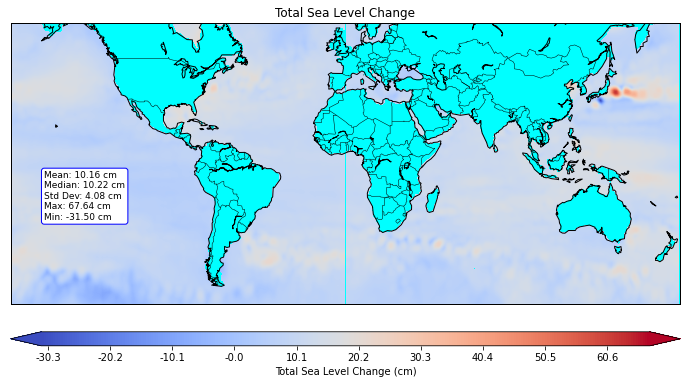

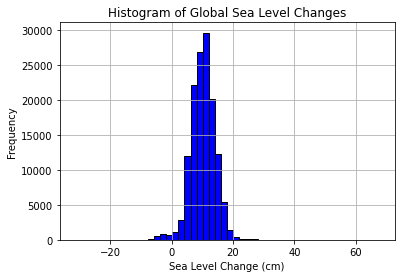

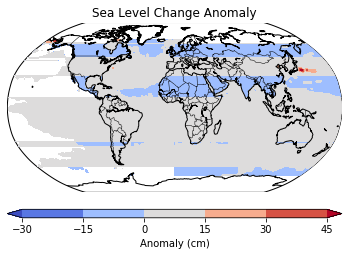

In [1]:
!pip install netCDF4
!pip install basemap
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.basemap import shiftgrid
from netCDF4 import Dataset
import numpy as np

file_path = 'cu_total_sea_level_change_1.nc'

# Open the NetCDF file
nc_file = Dataset(file_path, mode='r')

# Extract data
lats = nc_file.variables['lat'][:]
lons = nc_file.variables['lon'][:]
sea_level_change = nc_file.variables['change'][:]  # Assuming sea level change is in cm as per the attributes
filled_sea_level_change = sea_level_change.filled(np.nan)

nc_file.close()

# Calculate regional statistics
mean_change = np.nanmean(filled_sea_level_change)
median_change = np.nanmedian(filled_sea_level_change)
std_change = np.nanstd(filled_sea_level_change)
max_change = np.nanmax(filled_sea_level_change)
min_change = np.nanmin(filled_sea_level_change)

# Print Global statistics
print(f'Global Statistics')
print(f'Mean Sea Level Change: {mean_change:.2f} cm')
print(f'Median Sea Level Change: {median_change:.2f} cm')
print(f'Standard Deviation of Sea Level Change: {std_change:.2f} cm')
print(f'Maximum Sea Level Change: {max_change:.2f} cm')
print(f'Minimum Sea Level Change: {min_change:.2f} cm')

# Define your region of interest for the contiguous US
min_lat, max_lat = 24, 49
min_lon, max_lon = -125, -66
    
# Adjust the longitude range for datasets that use 0 to 360 instead of -180 to 180
adjusted_min_lon = 360 + min_lon if min_lon < 0 else min_lon
adjusted_max_lon = 360 + max_lon if max_lon < 0 else max_lon

# Mask the array for the region of interest with adjusted longitudes
mask_lon = (lons >= adjusted_min_lon) & (lons <= adjusted_max_lon)
mask_lat = (lats >= min_lat) & (lats <= max_lat)
regional_sea_level_change = sea_level_change[np.ix_(mask_lat, mask_lon)]

# Calculate statistics
regional_mean = np.nanmean(regional_sea_level_change)
regional_median = np.nanmedian(regional_sea_level_change)
regional_std_dev = np.nanstd(regional_sea_level_change)
regional_max = np.nanmax(regional_sea_level_change)
regional_min = np.nanmin(regional_sea_level_change)

print(f"US Mainland")
print(f"Regional Mean Sea Level Change: {regional_mean:.2f} cm")
print(f"Regional Median Sea Level Change: {regional_median:.2f} cm")
print(f"Regional Standard Deviation of Sea Level Change: {regional_std_dev:.2f} cm")
print(f"Regional Maximum Sea Level Change: {regional_max:.2f} cm")
print(f"Regional Minimum Sea Level Change: {regional_min:.2f} cm")

# Alaska approximate bounding box
min_lat_alaska, max_lat_alaska = 51, 71.5
min_lon_alaska, max_lon_alaska = -179.148909, -129.974487

if np.any(lons > 180):
    min_lon_alaska = min_lon_alaska + 360 if min_lon_alaska < 0 else min_lon_alaska
    max_lon_alaska = max_lon_alaska + 360 if max_lon_alaska < 0 else max_lon_alaska

# Apply the masks for Alaska
mask_lat_alaska = (lats >= min_lat_alaska) & (lats <= max_lat_alaska)
mask_lon_alaska = (lons >= min_lon_alaska) & (lons <= max_lon_alaska)
alaska_sea_level_change = sea_level_change[np.ix_(mask_lat_alaska, mask_lon_alaska)]

# Compute statistics for Alaska
alaska_mean = np.nanmean(alaska_sea_level_change)
alaska_std = np.nanstd(alaska_sea_level_change)
alaska_max = np.nanmax(alaska_sea_level_change)
alaska_min = np.nanmin(alaska_sea_level_change)

# Print the statistics for Alaska
print("Alaska")
print(f"Mean Sea Level Change: {alaska_mean:.2f} cm")
print(f"Standard Deviation of Sea Level Change: {alaska_std:.2f} cm")
print(f"Maximum Sea Level Change: {alaska_max:.2f} cm")
print(f"Minimum Sea Level Change: {alaska_min:.2f} cm")

plt.figure(figsize=(12, 6))
# Draw coastlines, countries, and boundaries
m = Basemap(projection='merc', llcrnrlat=-60, urcrnrlat=60,
                llcrnrlon=-180, urcrnrlon=180, lat_ts=20, resolution='c')
#m = Basemap(projection='robin', lon_0=0, resolution='c')
sea_level_change, lons_shifted = shiftgrid(180., sea_level_change, lons, start=False)

# Use the shifted longitudes for the meshgrid
lon, lat = np.meshgrid(lons_shifted, lats)
xi, yi = m(lon, lat)
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='aqua')
cs = m.contourf(xi, yi, np.squeeze(sea_level_change), levels=np.linspace(min_change, max_change, 256), cmap='coolwarm', extend='both')
cbar = m.colorbar(cs, location='bottom', pad="10%", format='%.1f')
cbar.set_label('Total Sea Level Change (cm)')

# Annotate statistics on the map
plt.annotate(f'Mean: {mean_change:.2f} cm\nMedian: {median_change:.2f} cm\nStd Dev: {std_change:.2f} cm\nMax: {max_change:.2f} cm\nMin: {min_change:.2f} cm',
             xy=(0.05, 0.3), xycoords='axes fraction', fontsize=9, bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="b", lw=1))

plt.title('Total Sea Level Change')
plt.savefig('Enhanced_Total_Sea_Level_Change.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

# Assuming sea_level_change is a 2D numpy array and not masked
flat_change = sea_level_change.ravel()
flat_change = flat_change[~np.isnan(flat_change)]  # Remove NaN values for the histogram

plt.figure()
plt.hist(flat_change, bins=50, color='blue', edgecolor='black')
plt.title('Histogram of Global Sea Level Changes')
plt.xlabel('Sea Level Change (cm)')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('Histogram_Total_Sea_Level_Change.png')
plt.show()

# Calculate the anomaly by subtracting the global mean from the sea level change
sea_level_anomaly = sea_level_change - mean_change

# Plot the anomaly
plt.figure()
m = Basemap(projection='robin', lon_0=0, resolution='c')
m.drawcoastlines()
m.drawcountries()

# Shift the grid if needed
sea_level_change, lons_shifted = shiftgrid(180., sea_level_change, lons, start=False)

# Ensure that longitudes are monotonically increasing
if not np.all(np.diff(lons_shifted) > 0):
    # If they're not, this step ensures that the longitudes are from 0 to 360.
    lons_shifted = np.where(lons_shifted < 0, lons_shifted + 360, lons_shifted)

# Ensure lons_shifted is in ascending order
sorted_indices = np.argsort(lons_shifted)
lons_shifted = lons_shifted[sorted_indices]
sea_level_change = sea_level_change[:, sorted_indices]

# Create the meshgrid using shifted longitudes and original latitudes
lon, lat = np.meshgrid(lons_shifted, lats)
xi, yi = m(lon, lat)
cs = m.contourf(xi, yi, sea_level_anomaly, cmap='coolwarm', extend='both')
plt.title('Sea Level Change Anomaly')
cbar = m.colorbar(cs, location='bottom', pad="10%")
cbar.set_label('Anomaly (cm)')
plt.savefig('Anomaly_Sea_Level_Change.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

/tmp/ipykernel_13072/3139104964.py:31: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  cs = m.pcolormesh(xi, yi, trends_wrapped, cmap='coolwarm', shading='auto')


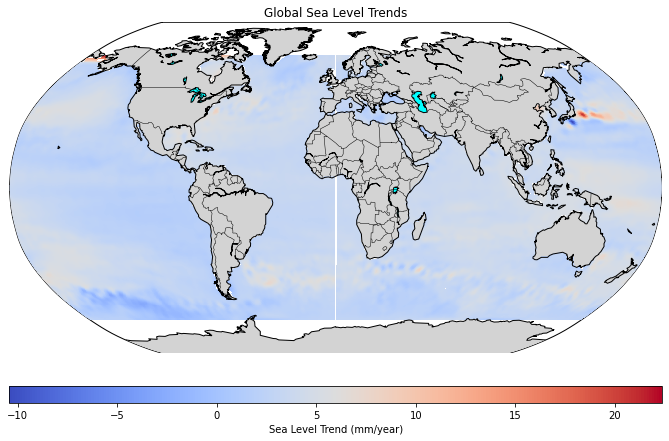

In [19]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import numpy as np
from netCDF4 import Dataset

# Function to wrap the array and corresponding coordinates
def wrap_data(array, lons, target_lon=180):
    """
    Wraps the array around the specified longitude
    """
    wrap_index = np.where(lons >= target_lon)[0][0]
    wrapped_lons = np.hstack((lons[wrap_index:] - 360.0, lons[:wrap_index]))
    wrapped_data = np.hstack((array[:, wrap_index:], array[:, :wrap_index]))
    return wrapped_data, wrapped_lons

file_path = 'cu_sea_level_trends_4.nc'
nc_file = Dataset(file_path, mode='r')
lats = nc_file.variables['lat'][:]
lons = nc_file.variables['lon'][:]
trends = nc_file.variables['trends'][:]  # Sea level trends
nc_file.close()

trends_wrapped, lons_wrapped = wrap_data(trends, lons)
plt.figure(figsize=(14, 7))
m = Basemap(projection='robin', lon_0=0, resolution='c')
m.drawcoastlines()
m.drawcountries()
m.fillcontinents(color='lightgray', lake_color='aqua')
lon, lat = np.meshgrid(lons_wrapped, lats)
xi, yi = m(lon, lat)
cs = m.pcolormesh(xi, yi, trends_wrapped, cmap='coolwarm', shading='auto')
cbar = m.colorbar(cs, location='bottom', pad="10%")
cbar.set_label('Sea Level Trend (mm/year)')
plt.title('Global Sea Level Trends')
plt.savefig('global_sea_level_trends_improved.png', dpi=300, bbox_inches='tight')
plt.show()

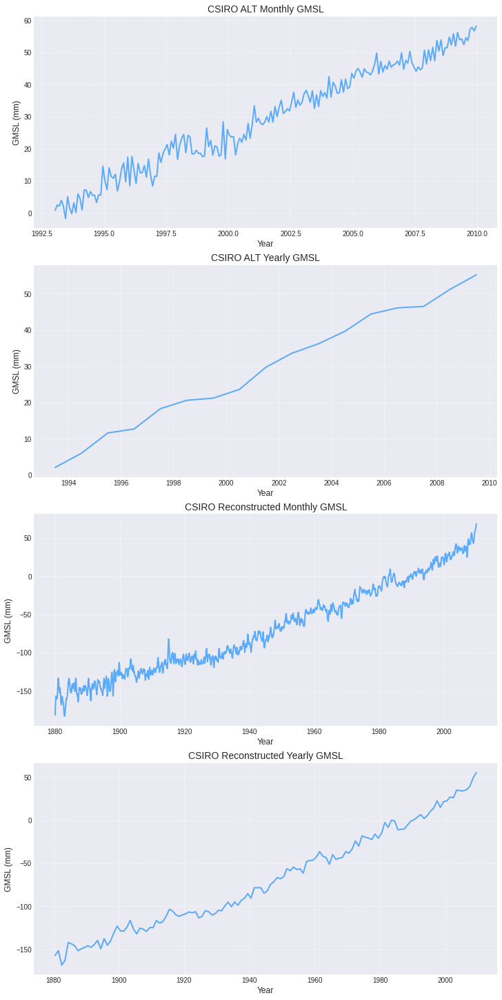

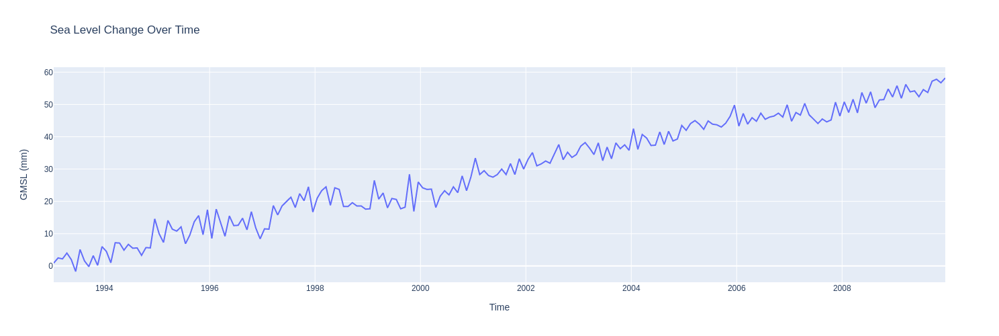

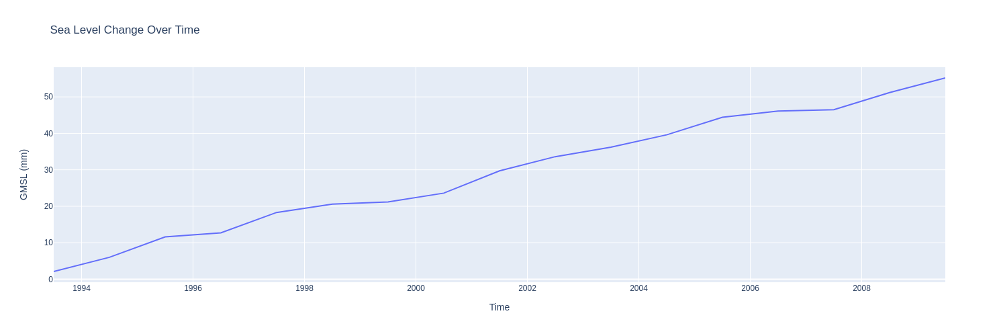

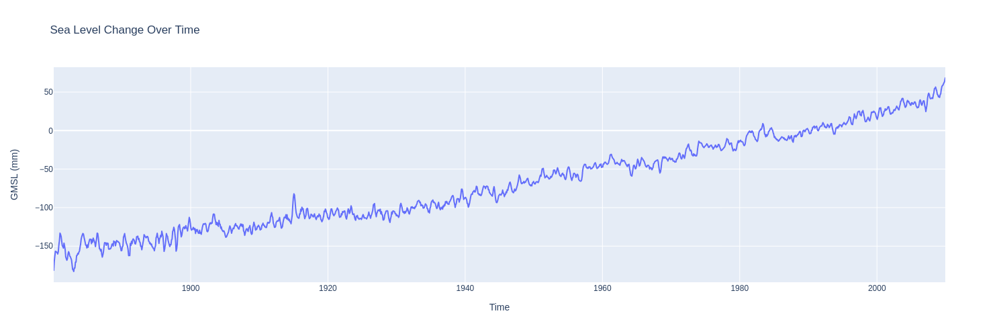

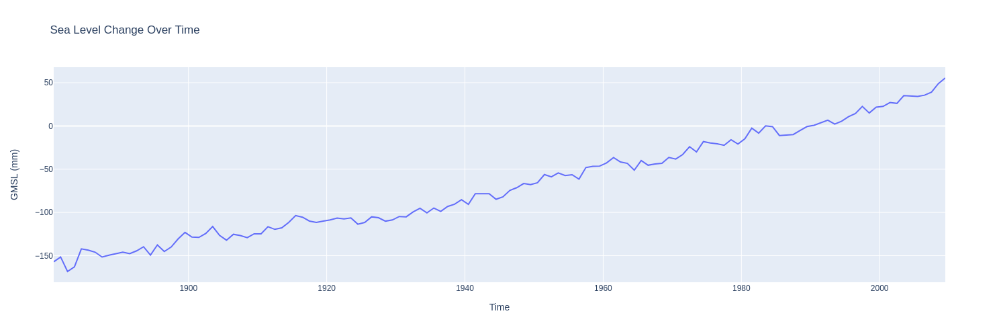

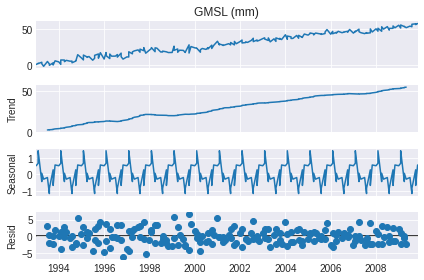

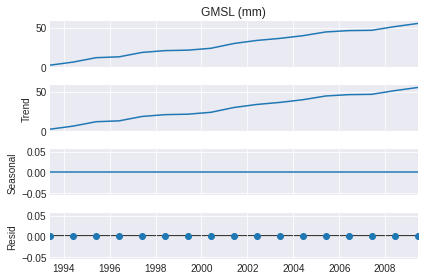

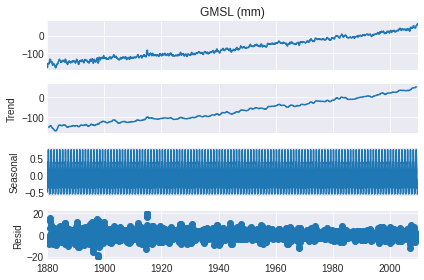

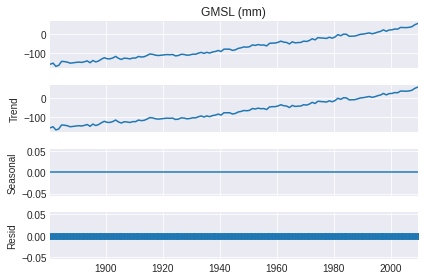

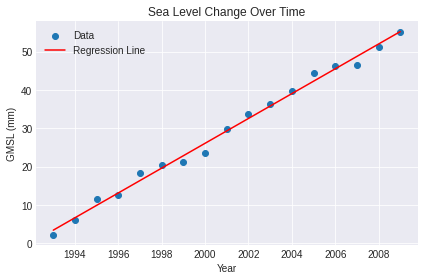

                            OLS Regression Results                            
Dep. Variable:              GMSL (mm)   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     2056.
Date:                Mon, 01 Apr 2024   Prob (F-statistic):           1.81e-17
Time:                        16:46:46   Log-Likelihood:                -29.273
No. Observations:                  17   AIC:                             62.55
Df Residuals:                      15   BIC:                             64.21
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -6444.8211    142.785    -45.137      0.0

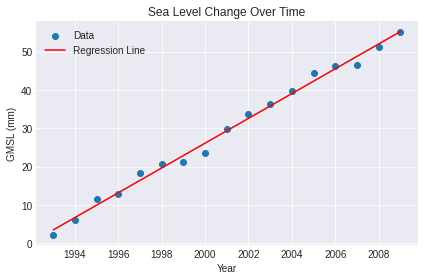

                            OLS Regression Results                            
Dep. Variable:              GMSL (mm)   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     2057.
Date:                Mon, 01 Apr 2024   Prob (F-statistic):           1.80e-17
Time:                        16:46:46   Log-Likelihood:                -29.255
No. Observations:                  17   AIC:                             62.51
Df Residuals:                      15   BIC:                             64.18
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -6439.5897    142.633    -45.148      0.0

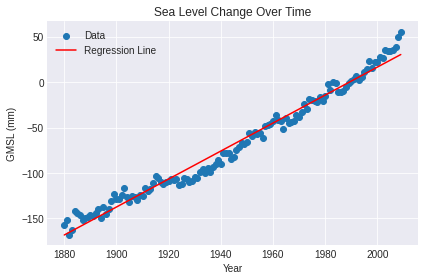

                            OLS Regression Results                            
Dep. Variable:              GMSL (mm)   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     5776.
Date:                Mon, 01 Apr 2024   Prob (F-statistic):          2.28e-108
Time:                        16:46:47   Log-Likelihood:                -464.05
No. Observations:                 130   AIC:                             932.1
Df Residuals:                     128   BIC:                             937.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -3059.3285     39.353    -77.741      0.0

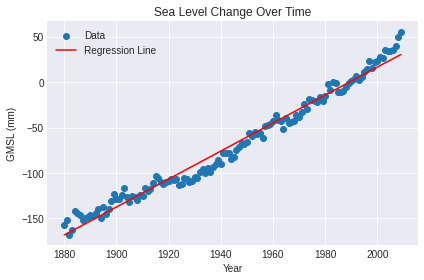

                            OLS Regression Results                            
Dep. Variable:              GMSL (mm)   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     5775.
Date:                Mon, 01 Apr 2024   Prob (F-statistic):          2.33e-108
Time:                        16:46:47   Log-Likelihood:                -464.07
No. Observations:                 130   AIC:                             932.1
Df Residuals:                     128   BIC:                             937.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -3059.1974     39.358    -77.728      0.0

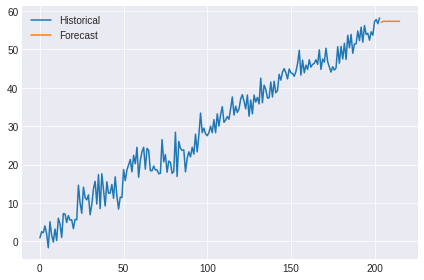

                               SARIMAX Results                                
Dep. Variable:              GMSL (mm)   No. Observations:                   17
Model:                 ARIMA(5, 1, 0)   Log Likelihood                 -33.355
Date:                Mon, 01 Apr 2024   AIC                             78.711
Time:                        16:46:48   BIC                             83.346
Sample:                             0   HQIC                            78.948
                                 - 17                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1872      0.330      0.567      0.571      -0.460       0.834
ar.L2          0.1164      0.222      0.525      0.600      -0.318       0.551
ar.L3          0.2788      0.224      1.243      0.2

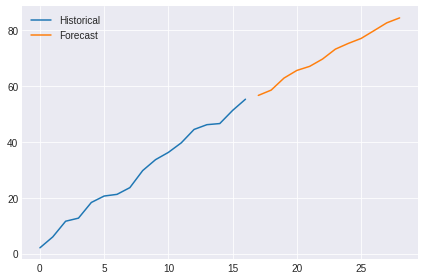

                               SARIMAX Results                                
Dep. Variable:              GMSL (mm)   No. Observations:                 1560
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -3578.852
Date:                Mon, 01 Apr 2024   AIC                           7169.704
Time:                        16:46:48   BIC                           7201.815
Sample:                             0   HQIC                          7181.644
                               - 1560                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3347      0.021     15.986      0.000       0.294       0.376
ar.L2          0.3843      0.022     17.224      0.000       0.341       0.428
ar.L3         -0.5490      0.022    -25.074      0.0

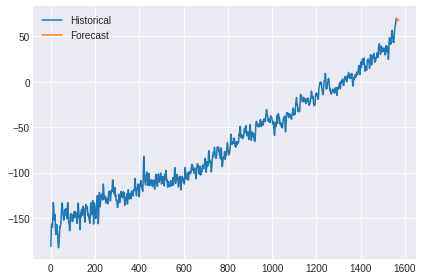

                               SARIMAX Results                                
Dep. Variable:              GMSL (mm)   No. Observations:                  130
Model:                 ARIMA(5, 1, 0)   Log Likelihood                -408.035
Date:                Mon, 01 Apr 2024   AIC                            828.071
Time:                        16:46:49   BIC                            845.230
Sample:                             0   HQIC                           835.043
                                - 130                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2066      0.099     -2.077      0.038      -0.402      -0.012
ar.L2         -0.0647      0.083     -0.776      0.438      -0.228       0.099
ar.L3          0.0436      0.109      0.399      0.6

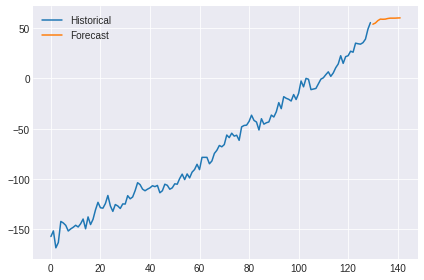

In [39]:
!pip install statsmodels
import warnings
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.regression.linear_model import OLS
from statsmodels.tools.tools import add_constant
from scipy.stats import kurtosistest
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose

plt.style.use('seaborn-darkgrid')

def read_and_plot(file_name, ax, title, file_suffix):
    df = pd.read_csv(file_name)
    ax.plot(df['Time'], df['GMSL (mm)'], color='dodgerblue', linewidth=2, alpha=0.7)
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('Year', fontsize=12)
    ax.set_ylabel('GMSL (mm)', fontsize=12)
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.tick_params(axis='both', which='major', labelsize=10)

fig, axs = plt.subplots(4, 1, figsize=(10, 20), constrained_layout=True)

read_and_plot('CSIRO_ALT_gmsl_mo_2009.csv', axs[0], 'CSIRO ALT Monthly GMSL', 'CSIRO_ALT_monthly_gmsl')
read_and_plot('CSIRO_ALT_gmsl_yr_2009.csv', axs[1], 'CSIRO ALT Yearly GMSL', 'CSIRO_ALT_yearly_gmsl')
read_and_plot('CSIRO_Recons_gmsl_mo_2009.csv', axs[2], 'CSIRO Reconstructed Monthly GMSL', 'CSIRO_Recons_monthly_gmsl')
read_and_plot('CSIRO_Recons_gmsl_yr_2009.csv', axs[3], 'CSIRO Reconstructed Yearly GMSL', 'CSIRO_Recons_yearly_gmsl')

plt.savefig(f'CSIRO_GMSL_plot.png', facecolor='w', transparent=True)
plt.show()

def enhanced_visualization(file):
    df = pd.read_csv(file)
    fig = px.line(df, x='Time', y='GMSL (mm)', title='Sea Level Change Over Time')
    fig.update_layout(autosize=False, width=1000, height=500)
    fig.show()
    
def trend_decomposition(file, freq):
    df = pd.read_csv(file)
    df['Year'] = df['Time'].apply(lambda x: int(x))
    df['Month'] = ((df['Time'] - df['Year']) * 12).round().astype(int)
    df['Day'] = 1  # assuming the first day of the month for simplicity
    df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])

    if df['Date'].isna().any():
        raise ValueError("NaT values found in 'Date' column. Check time conversion.")
    df.set_index('Date', inplace=True)

    if freq == 'M':
        period = 12  # Monthly data
    elif freq == 'A':
        period = 1   # Annual data

    if df.index.nunique() < 2 * period:
        raise ValueError(f"Not enough data for decomposition: requires at least {2 * period} unique observations.")
    
    decomposition = seasonal_decompose(df['GMSL (mm)'], model='additive', period=period)
    decomposition.plot()
    plt.show()
    
files_freq = {
    'CSIRO_ALT_gmsl_mo_2009.csv': 'M',
    'CSIRO_ALT_gmsl_yr_2009.csv': 'A',
    'CSIRO_Recons_gmsl_mo_2009.csv': 'M',
    'CSIRO_Recons_gmsl_yr_2009.csv': 'A'
}
    
for file in ['CSIRO_ALT_gmsl_mo_2009.csv', 'CSIRO_ALT_gmsl_yr_2009.csv',
             'CSIRO_Recons_gmsl_mo_2009.csv', 'CSIRO_Recons_gmsl_yr_2009.csv']:
    enhanced_visualization(file)

for file, freq in files_freq.items():
    try:
        trend_decomposition(file, freq=freq)
    except ValueError as e:
        print(f"Error processing {file}: {e}")

def linear_regression_and_plot(file):
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning, message="kurtosistest only valid for n>=20")
        
        df = pd.read_csv(file)
        df['Year'] = df['Time'].apply(lambda x: int(str(x)[:4]))
        df = df.groupby('Year').mean().reset_index()  # Take annual mean if necessary
        
        # Simple Linear Regression
        X = sm.add_constant(df['Year'])  # Adds a constant term to the predictor
        y = df['GMSL (mm)']
        model = sm.OLS(y, X).fit()  # OLS regression
        predictions = model.predict(X)
        
        # Plotting the regression line
        plt.scatter(df['Year'], df['GMSL (mm)'], label='Data')
        plt.plot(df['Year'], predictions, color='red', label='Regression Line')
        plt.xlabel('Year')
        plt.ylabel('GMSL (mm)')
        plt.title('Sea Level Change Over Time')
        plt.legend()
        plt.tight_layout()
        filename = file.replace('.csv', '_plot.png')
        plt.savefig("Linear Regression " + filename, format='png', dpi=300, bbox_inches='tight')
        plt.show()
        
        # Print out the statistics
        print(model.summary())
    
linear_regression_and_plot('CSIRO_ALT_gmsl_mo_2009.csv')
linear_regression_and_plot('CSIRO_ALT_gmsl_yr_2009.csv')
linear_regression_and_plot('CSIRO_Recons_gmsl_mo_2009.csv')
linear_regression_and_plot('CSIRO_Recons_gmsl_yr_2009.csv')

def ARIMA_forecasting(file):
    df = pd.read_csv(file)
    # Fit the model
    model = ARIMA(df['GMSL (mm)'], order=(5,1,0))  # The order (p,d,q) needs to be optimized
    model_fit = model.fit()

    # Summary of the model
    print(model_fit.summary())

    # Forecasting
    forecast = model_fit.forecast(steps=12)  # Predicting the next 12 time points

    # Plotting the forecast
    plt.plot(df['GMSL (mm)'], label='Historical')
    plt.plot(forecast, label='Forecast')
    plt.legend()
    plt.tight_layout()
    filename = file.replace('.csv', '_plot.png')
    plt.savefig("ARIMA Forecasting " + filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
ARIMA_forecasting('CSIRO_ALT_gmsl_mo_2009.csv')
ARIMA_forecasting('CSIRO_ALT_gmsl_yr_2009.csv')
ARIMA_forecasting('CSIRO_Recons_gmsl_mo_2009.csv')
ARIMA_forecasting('CSIRO_Recons_gmsl_yr_2009.csv')

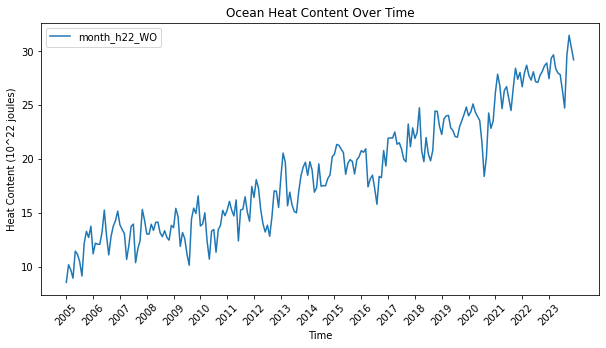

In [1]:
import cftime
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
import pandas as pd
import matplotlib.dates as mdates

def plot_ocean_heat_content(nc_file_path, variable_name):
    ds = nc.Dataset(nc_file_path)
    
    # Convert the time variable to ordinals
    times = ds.variables['time'][:]
    dates = nc.num2date(times, units=ds.variables['time'].units, calendar='360_day')
    ordinals = [date.toordinal() for date in dates]
    heat_content = ds.variables[variable_name][:]
    
    if hasattr(ds.variables[variable_name], '_FillValue'):
        fill_value = ds.variables[variable_name]._FillValue
    else:
        fill_value = np.nan  # Use NaN as a default fill_value if _FillValue is not present
    
    heat_content = np.ma.masked_where(heat_content == fill_value, heat_content)
    
    df = pd.DataFrame({
        'Time': ordinals,
        'Heat_Content': heat_content.data  # .data to ensure we work with the underlying numpy array
    })
    
    plt.figure(figsize=(10, 5))
    plt.plot(df['Time'], df['Heat_Content'], label=variable_name)
    new_labels = [str(date.year) for date in dates]
    plt.xticks(ordinals[::12], new_labels[::12], rotation=45)
    plt.xlabel('Time')
    plt.ylabel('Heat Content (10^22 joules)')
    plt.title('Ocean Heat Content Over Time')
    plt.legend()
    plt.savefig("Ocean_Heat_Content_Over_Time", format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Use the function
nc_file_path = 'heat_content_anomaly_0-2000_monthly.nc'
plot_ocean_heat_content(nc_file_path, 'month_h22_WO')

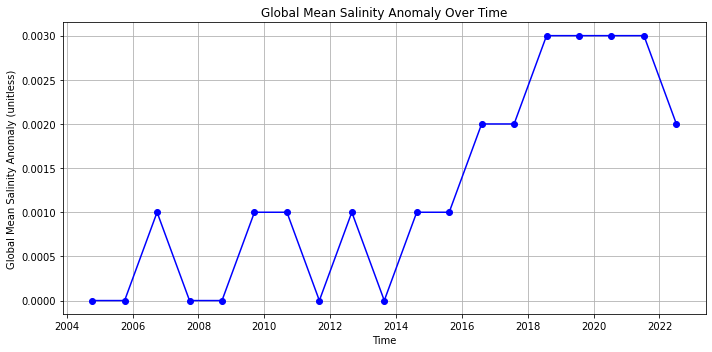

In [2]:
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np

def manual_months_to_date(time_var, base_date):
    # Convert 'months since' to datetime objects manually
    dates = [base_date + timedelta(days=30 * month) for month in time_var]
    return dates

def plot_global_mean_salinity(nc_file_path, variable_name):
    # Open the NetCDF file
    ds = nc.Dataset(nc_file_path)
    
    # Extract time variable
    time_var = ds.variables['time']
    
    # Manual conversion of 'months since' to datetime, assuming '360_day' calendar or similar
    base_date = datetime(1955, 1, 1)  # Adjust based on the 'units' attribute of the 'time' variable
    time = manual_months_to_date(time_var[:], base_date)
    
    # Extract the salinity anomaly variable
    salinity_anomaly = ds.variables[variable_name][:]
    
    # Mask invalid values
    salinity_anomaly = np.ma.masked_invalid(salinity_anomaly)
    
    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(time, salinity_anomaly, marker='o', linestyle='-', color='blue')
    plt.xlabel('Time')
    plt.ylabel('Global Mean Salinity Anomaly (unitless)')
    plt.title('Global Mean Salinity Anomaly Over Time')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("Salinity_Anomaly_Over_Time", format='png', dpi=300, bbox_inches='tight')
    plt.show()

nc_file_path = 'mean_salinity_anomaly_0-2000_yearly.nc'
variable_name = 'yearl_S_pss_WO'
plot_global_mean_salinity(nc_file_path, variable_name)

Sea Level Date Range: 2005-01-16 05:32:31.920000 to 2009-12-17 00:27:28.080000
Ocean Heat Content Date Range: 2005-01-16 00:00:00 to 2023-12-16 00:00:00


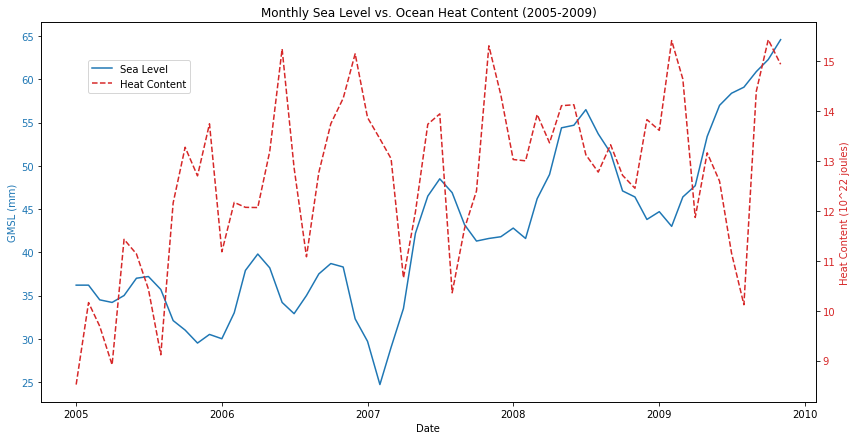

Correlation coefficient: 0.2516383197520595
R^2 (Coefficient of Determination): 0.0633


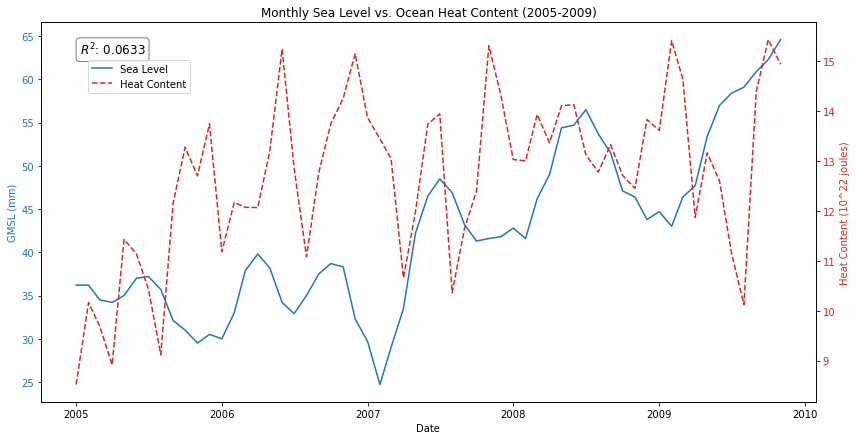

In [10]:
import pandas as pd
import numpy as np
import netCDF4 as nc
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

def ensure_timestamps(nc_dataset, time_var_name):
    """Converts cftime dates to pandas Timestamps for '360_day' calendar."""
    time_var = nc_dataset.variables[time_var_name]
    # Use '360_day' calendar for conversion as required by the 'months since' units
    calendar = '360_day'
    cftime_dates = nc.num2date(time_var[:], units=time_var.units, calendar=calendar)
    # Convert to ISO format strings before converting to Timestamps to avoid calendar issues
    timestamps = pd.to_datetime([date.isoformat() for date in cftime_dates])
    return timestamps

# Function to convert decimal years to datetime
def decimal_years_to_datetimes(decimal_years):
    start_year = np.floor(decimal_years).astype(int)
    remainder = decimal_years - start_year
    base_date = pd.to_datetime(start_year, format='%Y')
    dates = base_date + pd.to_timedelta(remainder * 365.25, unit='D')
    return dates

# Load Sea Level Rise Data from CSV and convert decimal year to datetime
sea_level_df = pd.read_csv('CSIRO_Recons_gmsl_mo_2009.csv')
sea_level_df['Time'] = decimal_years_to_datetimes(sea_level_df['Time'])
sea_level_df.set_index('Time', inplace=True)

# Load and prepare ocean heat content data
heat_content_nc = nc.Dataset('heat_content_anomaly_0-2000_monthly.nc')
heat_content_time = ensure_timestamps(heat_content_nc, 'time')
heat_content_values = heat_content_nc.variables['month_h22_WO'][:]
heat_content_df = pd.DataFrame({'Heat_Content': heat_content_values}, index=heat_content_time)

# Define the common date range
common_start_date = '2005-01-16'
common_end_date = '2009-12-17'

# Filter both datasets to the common date range
sea_level_df_filtered = sea_level_df[(sea_level_df.index >= common_start_date) & (sea_level_df.index <= common_end_date)]
heat_content_df_filtered = heat_content_df[(heat_content_df.index >= common_start_date) & (heat_content_df.index <= common_end_date)]

# Display the date ranges of both datasets before alignment
print("Sea Level Date Range:", sea_level_df_filtered.index.min(), "to", sea_level_df.index.max())
print("Ocean Heat Content Date Range:", heat_content_df_filtered.index.min(), "to", heat_content_df.index.max())

# Resample both datasets to the start of each month to align them by month and year
sea_level_monthly = sea_level_df_filtered.resample('MS').mean()
heat_content_monthly = heat_content_df.resample('MS').mean()

# Merge the datasets on their index (date) to ensure they are aligned
aligned_df = pd.merge(sea_level_monthly, heat_content_monthly, left_index=True, right_index=True, how='inner')

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:blue'
ax1.set_xlabel('Date')
ax1.set_ylabel('GMSL (mm)', color=color)
ax1.plot(aligned_df.index, aligned_df['GMSL (mm)'], color=color, label='Sea Level')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Heat Content (10^22 joules)', color=color)
ax2.plot(aligned_df.index, aligned_df['Heat_Content'], color=color, linestyle='--', label='Heat Content')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
fig.legend(loc="upper left", bbox_to_anchor=(0.1,0.9))
plt.title('Monthly Sea Level vs. Ocean Heat Content (2005-2009)')
plt.show()

# Correlation Analysis
if len(aligned_df) > 2:  # Ensuring there are more than 2 data points
    correlation = pearsonr(aligned_df['GMSL (mm)'], aligned_df['Heat_Content'])
    print(f"Correlation coefficient: {correlation[0]}")
else:
    print("Not enough data points for meaningful correlation analysis.")
    
fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:blue'
ax1.set_xlabel('Date')
ax1.set_ylabel('GMSL (mm)', color=color)
ax1.plot(aligned_df.index, aligned_df['GMSL (mm)'], color=color, label='Sea Level')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Heat Content (10^22 joules)', color=color)
ax2.plot(aligned_df.index, aligned_df['Heat_Content'], color=color, linestyle='--', label='Heat Content')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
fig.legend(loc="upper left", bbox_to_anchor=(0.1,0.9))
plt.title('Monthly Sea Level vs. Ocean Heat Content (2005-2009)')

# Calculate and display R^2 value
if len(aligned_df) > 2:
    r_value, _ = pearsonr(aligned_df['GMSL (mm)'], aligned_df['Heat_Content'])
    r_squared = r_value ** 2
    print(f"R^2 (Coefficient of Determination): {r_squared:.4f}")
    # Add R^2 value to the plot
    plt.text(0.05, 0.95, f'$R^2$: {r_squared:.4f}', transform=ax2.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
else:
    print("Not enough data points for meaningful correlation analysis.")

plt.show()

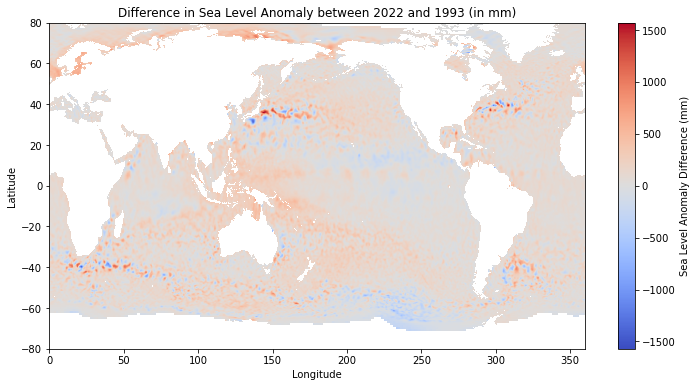

In [12]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np

# Load the NetCDF files as xarray datasets
ds_1993 = xr.open_dataset('./data/ssh_grids_v2205_1993100512.nc')
ds_2022 = xr.open_dataset('./data/ssh_grids_v2205_2022100812.nc')

# Extract the Sea Level Anomaly (SLA) data
sla_1993 = ds_1993['SLA'][0,:,:]  # Assuming SLA is stored as [time, lat, lon]
sla_2022 = ds_2022['SLA'][0,:,:]
sla_diff_mm = (sla_2022 - sla_1993) * 1000  # Convert from meters to millimeters

fig, ax = plt.subplots(figsize=(12, 6))
sla_diff_mm.plot(ax=ax, cmap='coolwarm', cbar_kwargs={'label': 'Sea Level Anomaly Difference (mm)'})
ax.set_title('Difference in Sea Level Anomaly between 2022 and 1993 (in mm)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

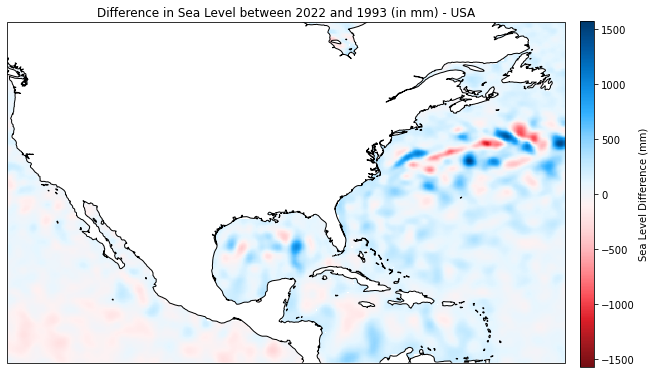

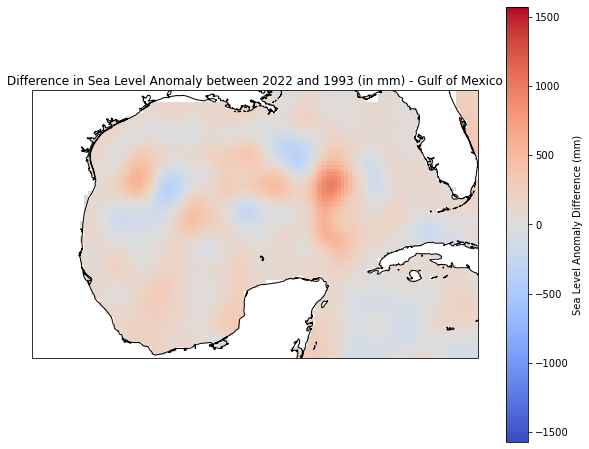

In [16]:
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
import cartopy.crs as ccrs
import warnings

with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=UserWarning)

    # Load the NetCDF files as xarray datasets
    ds_1993 = xr.open_dataset('./data/ssh_grids_v2205_1993100512.nc')
    ds_2022 = xr.open_dataset('./data/ssh_grids_v2205_2022100812.nc')

    # Extract the Sea Level Anomaly (SLA) data
    sla_1993 = ds_1993['SLA'][0,:,:]  # Assuming SLA is stored as [time, lat, lon]
    sla_2022 = ds_2022['SLA'][0,:,:]
    sla_diff_mm = (sla_2022 - sla_1993) * 1000  # Convert from meters to millimeters
    
    # Define the custom colormap from the given hex codes
    hex_codes = [
        '#750e13', '#a2191f', '#da1e28', '#fa4d56', '#ff8389', 
        '#ffb3b8', '#ffd7d9', '#fff1f1', '#e5f6ff', '#bae6ff',
        '#82cfff', '#33b1ff', '#1192e8', '#0072c3', '#00539a', '#003a6d'
    ]
    custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', hex_codes)

    # Plotting with focus on the mainland USA
    fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    adt_plot_diff = sla_diff_mm.plot(ax=ax, cmap=custom_cmap, add_colorbar=False, transform=ccrs.PlateCarree())
    '''sla_diff_mm.plot(ax=ax, cmap=custom_cmap, 
                     cbar_kwargs={
                         'label': 'Sea Level Difference (mm)',
                         'fraction': 0.046,  # Adjust this value as needed
                         'pad': 0.04,  # Adjust this value as needed
                         'shrink': 1.0  # This will make the colorbar the same height as the graph
                     }, 
                     transform=ccrs.PlateCarree())'''

    ax.set_title('Difference in Sea Level between 2022 and 1993 (in mm) - USA')
    ax.coastlines()
    ax.set_extent([-125, -50.93457, 10.396308, 49.384358])
    cbar_ax = fig.add_axes([0.92, 0.20, 0.02, 0.6])  # Position: [left, bottom, width, height]
    cbar = fig.colorbar(adt_plot_diff, cax=cbar_ax, orientation='vertical')
    cbar.set_label('Sea Level Difference (mm)')
    plt.savefig("Sea_Level_Difference_Change", format='png', dpi=600, bbox_inches='tight', facecolor='w', transparent=True)
    plt.show()

    # Plotting with focus on the Gulf of Mexico
    fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    sla_diff_mm.plot(ax=ax, cmap='coolwarm', cbar_kwargs={'label': 'Sea Level Anomaly Difference (mm)'}, transform=ccrs.PlateCarree())
    ax.set_title('Difference in Sea Level Anomaly between 2022 and 1993 (in mm) - Gulf of Mexico')
    ax.coastlines()
    ax.set_extent([-100, -80, 18, 30])  # Set the geographic extent to focus on the mainland USA
    plt.show()

Global Statistics
Mean Sea Level Change: 10.16 cm
Standard Deviation of Sea Level Change: 4.08 cm
Maximum Sea Level Change: 67.64 cm
Minimum Sea Level Change: -31.50 cm


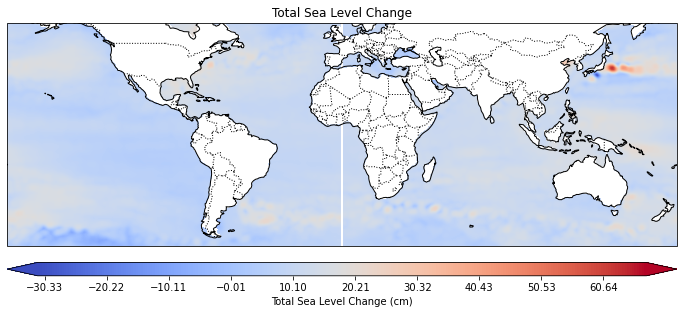

In [4]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from netCDF4 import Dataset
import numpy as np
import warnings

warnings.filterwarnings("ignore", category=UserWarning)

file_path = 'cu_total_sea_level_change_1.nc'
nc_file = Dataset(file_path, mode='r')

lats = nc_file.variables['lat'][:]
lons = nc_file.variables['lon'][:]
sea_level_change = nc_file.variables['change'][:]  # Assuming sea level change is in cm
filled_sea_level_change = np.ma.filled(sea_level_change, np.nan)

nc_file.close()

# Calculate global statistics
mean_change = np.nanmean(filled_sea_level_change)
std_change = np.nanstd(filled_sea_level_change)
max_change = np.nanmax(filled_sea_level_change)
min_change = np.nanmin(filled_sea_level_change)

print(f'Global Statistics\nMean Sea Level Change: {mean_change:.2f} cm\nStandard Deviation of Sea Level Change: {std_change:.2f} cm\nMaximum Sea Level Change: {max_change:.2f} cm\nMinimum Sea Level Change: {min_change:.2f} cm')

projection = ccrs.PlateCarree()
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': projection})
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_extent([-180, 180, -60, 60], crs=projection)

sea_level_img = ax.contourf(lons, lats, filled_sea_level_change, levels=np.linspace(min_change, max_change, 256), cmap='coolwarm', extend='both', transform=ccrs.PlateCarree())
cbar = plt.colorbar(sea_level_img, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label('Total Sea Level Change (cm)')
plt.title('Total Sea Level Change')
plt.savefig('Enhanced_Total_Sea_Level_Change_with_Cartopy.png', dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    description: University of Colorado Sea Level Trends 2023_rel2 (1992.96 - 2023.21)
    dimensions(sizes): lat(360), lon(720)
    variables(dimensions): float32 lat(lat), float32 lon(lon), float32 trends(lat, lon)
    groups: 


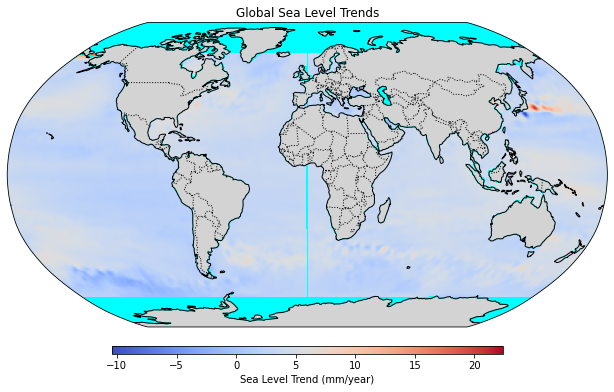

In [11]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
from netCDF4 import Dataset
import warnings

warnings.filterwarnings("ignore", category=UserWarning)

def wrap_data(array, lons, target_lon=180):
    wrap_index = np.where(lons >= target_lon)[0][0]
    wrapped_lons = np.hstack((lons[wrap_index:] - 360.0, lons[:wrap_index]))
    wrapped_data = np.hstack((array[:, wrap_index:], array[:, :wrap_index]))
    return wrapped_data, wrapped_lons

file_path = 'cu_sea_level_trends_4.nc'
nc_file = Dataset(file_path, mode='r')
lats = nc_file.variables['lat'][:]
lons = nc_file.variables['lon'][:]
trends = nc_file.variables['trends'][:]  
nc_file.close()

trends_wrapped, lons_wrapped = wrap_data(trends, lons)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, color='lightgray')
ax.set_global()
ax.add_feature(cfeature.OCEAN, color='aqua')

lon, lat = np.meshgrid(lons_wrapped, lats)
trend_img = ax.pcolormesh(lon, lat, trends_wrapped, cmap='coolwarm', shading='auto', transform=ccrs.PlateCarree())

cbar = plt.colorbar(trend_img, orientation='horizontal', pad=0.05, aspect=50, shrink=0.5)
cbar.set_label('Sea Level Trend (mm/year)')

plt.title('Global Sea Level Trends')

plt.savefig('global_sea_level_trends_cartopy_corrected.png', dpi=300, bbox_inches='tight')
plt.show()

       GeoId     GeoName GeoScale StateAbbrv  OceanSect_Id        OceanSector  \
4688  6000.0  California    State         CA           9.0  All Ocean Sectors   
4689  6000.0  California    State         CA           9.0  All Ocean Sectors   
4690  6000.0  California    State         CA           9.0  All Ocean Sectors   
4691  6000.0  California    State         CA           9.0  All Ocean Sectors   
4692  6000.0  California    State         CA           9.0  All Ocean Sectors   
...      ...         ...      ...        ...           ...                ...   
7275  6113.0    Yolo, CA   County         CA           9.0  All Ocean Sectors   
7276  6113.0    Yolo, CA   County         CA           9.0  All Ocean Sectors   
7277  6113.0    Yolo, CA   County         CA           9.0  All Ocean Sectors   
7278  6113.0    Yolo, CA   County         CA           9.0  All Ocean Sectors   
7279  6113.0    Yolo, CA   County         CA           9.0  All Ocean Sectors   

        Year  Establishment

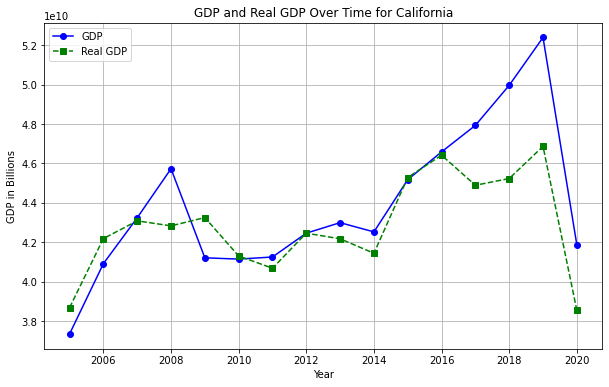

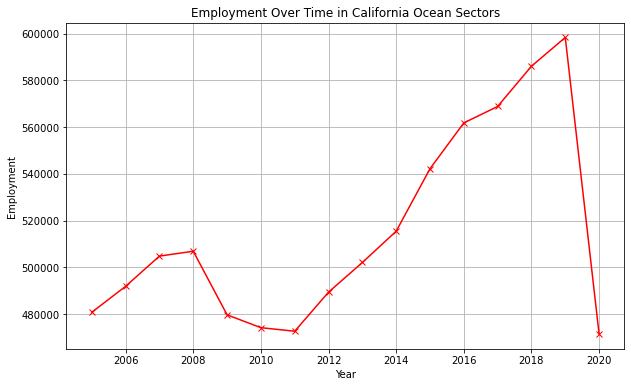

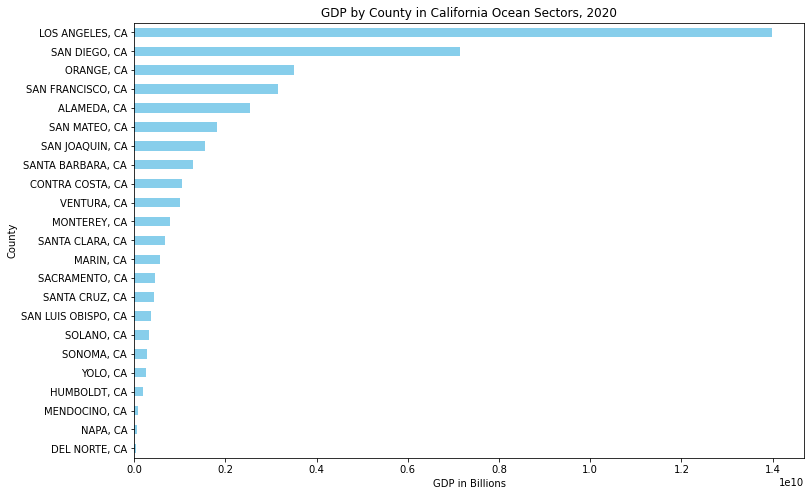

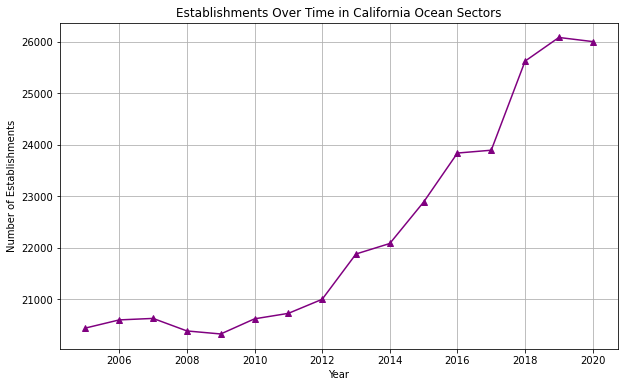

In [11]:
import dask.dataframe as dd
import pandas as pd
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore", category=UserWarning)

# Define the list of coastal states, excluding Great Lakes states
coastal_states = ['AL', 'AK', 'CA', 'CT', 'DE', 'FL', 'GA', 'HI', 'LA', 'ME', 'MD', 'MA', 'MS', 'NH', 'NJ', 'NY', 'NC', 'OR', 'RI', 'SC', 'TX', 'VA', 'WA']

csv_file_path = 'ENOW/ENOW_Sectors_2005_2020.csv'

dtype_dict = {
    'GeoId': 'float64',
    'GeoName': 'object',
    'GeoScale': 'object',
    'StateAbbrv': 'object',  # This column should be string, so 'object' is appropriate
    'OceanSect_Id': 'float64',
    'Year': 'float64',
    'Establishments': 'float64',
    'Employment': 'float64',
    'Wages': 'float64',
    'GDP': 'float64',
    'RealGDP': 'float64'
}
ddf = dd.read_csv(csv_file_path, dtype=dtype_dict)

# Ensure the columns are treated as strings before applying string methods
ddf['GeoName'] = ddf['GeoName'].astype(str)
ddf['StateAbbrv'] = ddf['StateAbbrv'].astype(str)
ddf['OceanSector'] = ddf['OceanSector'].astype(str)

# Now it's safe to apply string operations
ddf['GeoName_upper'] = ddf['GeoName'].str.upper().str.strip()
ddf['StateAbbrv_upper'] = ddf['StateAbbrv'].str.upper().str.strip()

# Apply the negative check and filtering
def negative_number_check(df):
    is_negative = df.select_dtypes(include=[int, float]).lt(0)
    rows_to_exclude = is_negative.any(axis=1)
    return ~rows_to_exclude  # Return True for rows to KEEP

negative_rows_mask = ddf.map_partitions(negative_number_check, meta=pd.Series(dtype=bool))

ddf_filtered = ddf[
    (~ddf['GeoName_upper'].isin(["NULL", "GREAT LAKES"])) &
    (ddf['StateAbbrv_upper'].isin(coastal_states)) &
    (ddf['OceanSector'] == "All Ocean Sectors")
]

# Since the filtering using negative_rows_mask wasn't correctly integrated before, let's apply it now.
# Note: We should filter the DataFrame AFTER computing the negative_rows_mask.
ddf_filtered = ddf_filtered[negative_rows_mask]

# Compute the result
df_filtered = ddf_filtered.compute()

# Split into individual state DataFrames
state_dfs = {state: df_filtered[df_filtered['StateAbbrv'] == state] for state in df_filtered['StateAbbrv'].unique()}

# Example usage
if 'CA' in state_dfs:
    print(state_dfs['CA'])

# Plotting GDP over time for the state of California
state_data = state_dfs['CA'][state_dfs['CA']['GeoScale'] == 'State']
plt.figure(figsize=(10, 6))
plt.plot(state_data['Year'], state_data['GDP'], marker='o', linestyle='-', color='blue', label='GDP')
plt.plot(state_data['Year'], state_data['RealGDP'], marker='s', linestyle='--', color='green', label='Real GDP')
plt.title('GDP and Real GDP Over Time for California')
plt.xlabel('Year')
plt.ylabel('GDP in Billions')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(state_data['Year'], state_data['Employment'], marker='x', linestyle='-', color='red')
plt.title('Employment Over Time in California Ocean Sectors')
plt.xlabel('Year')
plt.ylabel('Employment')
plt.grid(True)
plt.show()

# Assuming you want to compare GDP in 2020 across counties
county_data_2020 = state_dfs['CA'][(state_dfs['CA']['GeoScale'] == 'County') & (state_dfs['CA']['Year'] == 2020)]

plt.figure(figsize=(12, 8))
county_data_2020.set_index('GeoName_upper')['GDP'].sort_values().plot(kind='barh', color='skyblue')
plt.title('GDP by County in California Ocean Sectors, 2020')
plt.xlabel('GDP in Billions')
plt.ylabel('County')
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(state_data['Year'], state_data['Establishments'], marker='^', linestyle='-', color='purple')
plt.title('Establishments Over Time in California Ocean Sectors')
plt.xlabel('Year')
plt.ylabel('Number of Establishments')
plt.grid(True)
plt.show()

         GeoID     GeoName GeoScale    Year        OceanSector  OceanSect_ID  \
951     1000.0     Alabama    State  2005.0  All Ocean Sectors           9.0   
952     1000.0     Alabama    State  2006.0  All Ocean Sectors           9.0   
953     1000.0     Alabama    State  2007.0  All Ocean Sectors           9.0   
954     1000.0     Alabama    State  2008.0  All Ocean Sectors           9.0   
955     1000.0     Alabama    State  2009.0  All Ocean Sectors           9.0   
...        ...         ...      ...     ...                ...           ...   
14432  53000.0  Washington    State  2017.0  All Ocean Sectors           9.0   
14433  53000.0  Washington    State  2018.0  All Ocean Sectors           9.0   
14434  53000.0  Washington    State  2019.0  All Ocean Sectors           9.0   
14435  53000.0  Washington    State  2020.0  All Ocean Sectors           9.0   
14436  53000.0  Washington    State  2020.0  All Ocean Sectors           9.0   

      OceanIndustry  OceanInd_ID  Estab

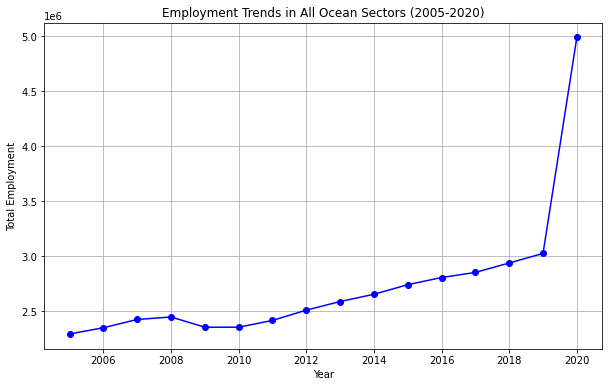

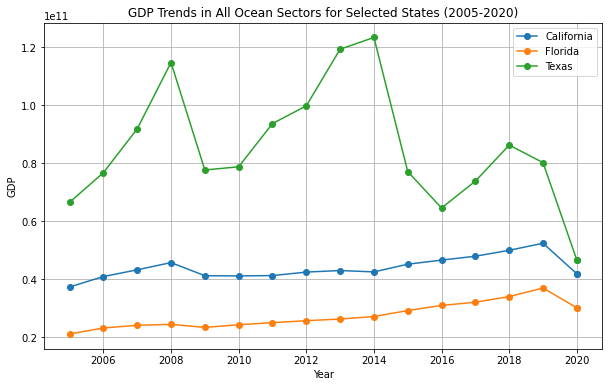

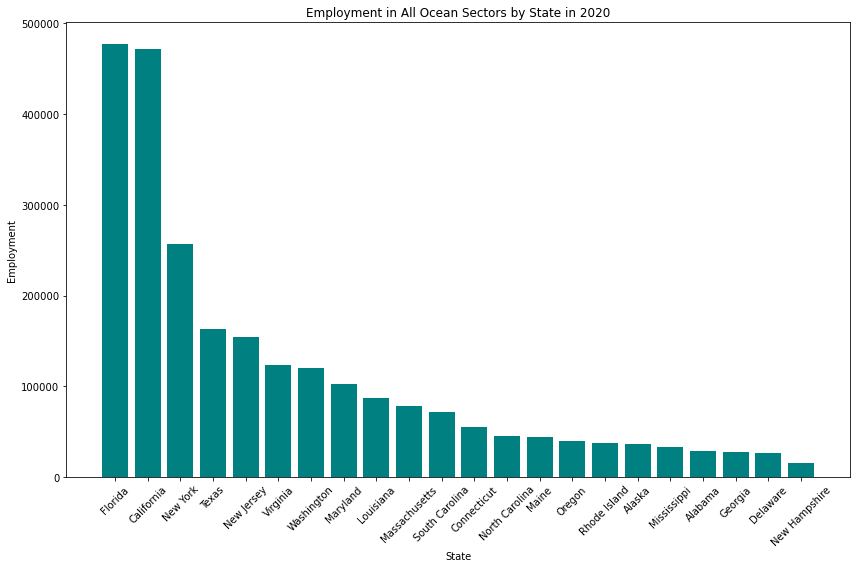

In [1]:
import dask.dataframe as dd
import matplotlib.pyplot as plt

coastal_states = ['Alabama', 'Alaska', 'California', 'Connecticut', 'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 'North Carolina', 'Oregon', 'Rhode Island', 'South Carolina', 'Texas', 'Virginia', 'Washington']

csv_file_path = 'ENOW/ENOW_Industries/ENOW_Industries_2005_2020.csv'

dtype_dict = {
    'GeoId': 'float64',
    'GeoName': 'object',
    'GeoScale': 'object',
    'Year': 'float64',
    'OceanSector': 'object',
    'OceanSect_Id': 'float64',
    'OceanIndustry': 'object',
    'OceanInd_Id': 'float64',
    'Establishments': 'float64',
    'Employment': 'float64',
    'Wages': 'float64',
    'GDP': 'float64',
    'RealGDP': 'float64'
}
ddf = dd.read_csv(csv_file_path, dtype=dtype_dict, assume_missing=True)

ddf['GeoName'] = ddf['GeoName'].astype(str)
ddf['OceanSector'] = ddf['OceanSector'].astype(str)
ddf['OceanIndustry'] = ddf['OceanIndustry'].astype(str)
ddf_filtered = ddf[
    (~ddf['GeoName'].isin(["National", "Hawaii"])) &
    (ddf['OceanSector'] == "All Ocean Sectors") &
    (ddf['OceanIndustry'] == "Total") &
    (ddf['GeoName'].isin(coastal_states))
]

def remove_negative_rows(df):
    numeric_cols = df.select_dtypes(include=['number'])
    mask = (numeric_cols >= 0).all(axis=1)
    return df[mask]

ddf_filtered = ddf_filtered.map_partitions(remove_negative_rows)
df_filtered = ddf_filtered.compute()

print(df_filtered)

# Grouping data by Year and summing up Employment for all states
employment_trend = df_filtered.groupby('Year')['Employment'].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.plot(employment_trend['Year'], employment_trend['Employment'], marker='o', linestyle='-', color='blue')
plt.title('Employment Trends in All Ocean Sectors (2005-2020)')
plt.xlabel('Year')
plt.ylabel('Total Employment')
plt.grid(True)
plt.show()

# Filtering for a few selected states (modify this list as needed)
selected_states = ['California', 'Florida', 'Texas']

# Plotting GDP trends for these states
plt.figure(figsize=(10, 6))
for state in selected_states:
    state_data = df_filtered[df_filtered['GeoName'] == state]
    plt.plot(state_data['Year'], state_data['GDP'], marker='o', linestyle='-', label=state)

plt.title('GDP Trends in All Ocean Sectors for Selected States (2005-2020)')
plt.xlabel('Year')
plt.ylabel('GDP')
plt.legend()
plt.grid(True)
plt.show()

# Selecting data for a specific year, e.g., 2020
year_data = df_filtered[df_filtered['Year'] == 2020]

# Sorting the data to get the top states by employment
sorted_data = year_data.sort_values('Employment', ascending=False)

plt.figure(figsize=(12, 8))
plt.bar(sorted_data['GeoName'], sorted_data['Employment'], color='teal')
plt.title('Employment in All Ocean Sectors by State in 2020')
plt.xlabel('State')
plt.ylabel('Employment')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

  countyFIPS         countyName  totalPopulation  totalHousingUnit  \
0      53069   Wahkiakum County             4318              2223   
1      48057     Calhoun County            21470             12091   
2      51735      Poquoson city            12121              4817   
3      51095  James City County            76032             33699   
4      22019   Calcasieu Parish           202858             91644   

   medianHouseholdIncome stateFIPS stateUSPS   stateName  \
0                54524.0        53        WA  Washington   
1                57170.0        48        TX       Texas   
2               100696.0        51        VA    Virginia   
3                91675.0        51        VA    Virginia   
4                52866.0        22        LA   Louisiana   

                                            geometry  
0  MULTIPOLYGON (((-123.43639 46.23820, -123.4343...  
1  MULTIPOLYGON (((-96.87329 28.62291, -96.87357 ...  
2  MULTIPOLYGON (((-76.41356 37.13856, -76.41354 ... 

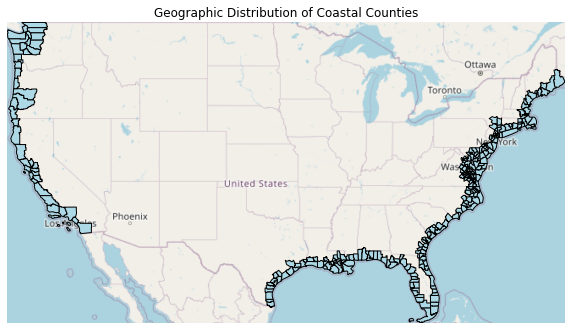

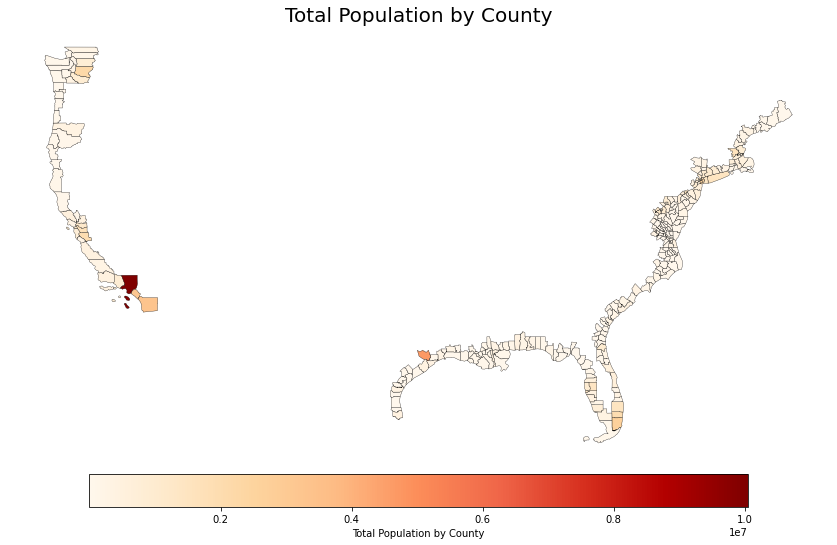

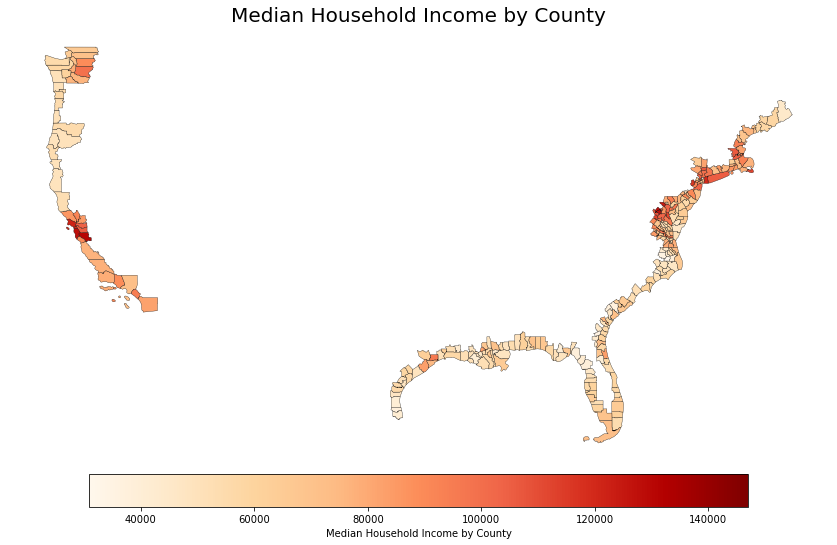

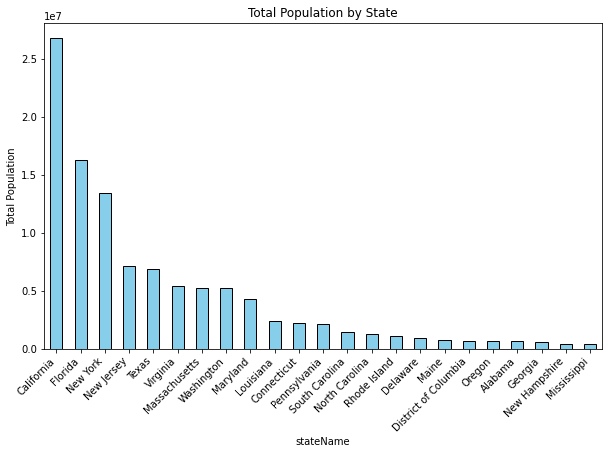

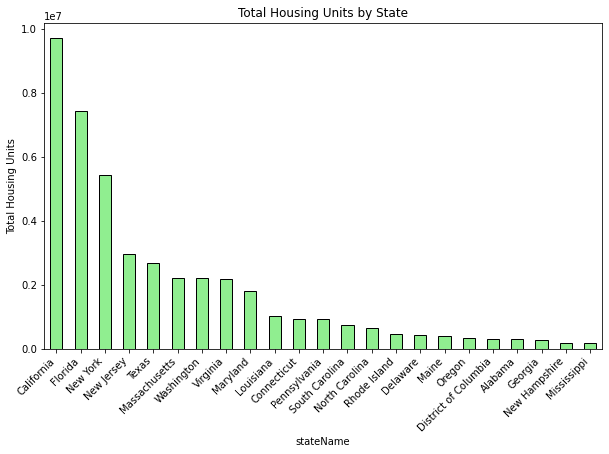

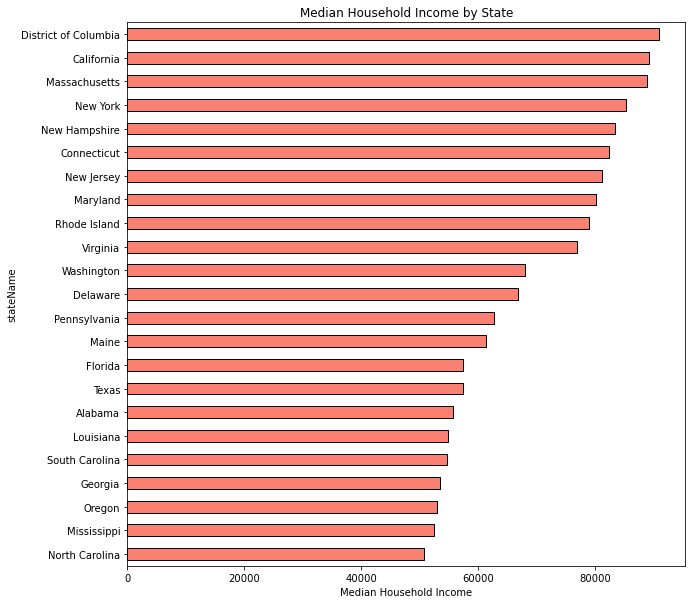

In [3]:
!pip install geopandas contextily

import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

gpkg_file_path = 'CoastalCounty.gpkg'
gdf = gpd.read_file(gpkg_file_path)
print(gdf.head())
print(gdf.dtypes)
layers = gpd.read_file(gpkg_file_path, layer=None)
print(layers)

# Simplify geometries for a cleaner look (adjust tolerance as needed)
gdf_simplified = gdf.copy()
gdf_simplified['geometry'] = gdf_simplified['geometry'].simplify(tolerance=0.01)
excluded_regions = ['Alaska', 'Hawaii', 'Puerto Rico', 'Guam', 'American Samoa', 'Commonwealth of the Northern Mariana Islands', 'United States Virgin Islands']
gdf_continental = gdf_simplified[~gdf_simplified['stateName'].isin(excluded_regions)]
#gdf_simplified = gdf_simplified[gdf_simplified['stateName'] == 'Florida']
gdf_web_mercator = gdf_continental.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(10, 10), facecolor='w')
gdf_web_mercator.plot(ax=ax, color='lightblue', edgecolor='black')
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
for child in ax.get_children():
    if isinstance(child, plt.Text):
        if 'OpenStreetMap' in child.get_text():
            child.set_visible(False)
ax.set_facecolor('white')
ax.set_xlim(gdf_web_mercator.total_bounds[[0, 2]])
ax.set_ylim(gdf_web_mercator.total_bounds[[1, 3]])
ax.set_title('Geographic Distribution of Coastal Counties')
plt.axis('off')
plt.savefig('Improved_Geographic_Distribution_of_Coastal_Counties.png', format='png', dpi=300, bbox_inches='tight', facecolor='white', transparent=True)
plt.show()

############
vmin, vmax = gdf_continental['totalPopulation'].min(), gdf_continental['totalPopulation'].max()

fig, ax = plt.subplots(1, 1, figsize=(12, 8), facecolor='w')
gdf_continental.plot(column='totalPopulation', ax=ax, legend=True,
                     cmap='OrRd',
                     edgecolor='black',
                     linewidth=0.3,
                     legend_kwds={'label': "Total Population by County",
                                  'orientation': "horizontal",
                                  'shrink': 0.8,
                                  'aspect': 20,
                                  'pad': 0.02},
                     vmin=vmin, vmax=vmax)
plt.tight_layout()
ax.set_axis_off()
plt.title('Total Population by County', fontdict={'fontsize': '20', 'fontweight': '3'})
plt.savefig('Total_Population_by_County_Improved.png', bbox_inches='tight', pad_inches=0, dpi=600, facecolor='white', transparent=False)
plt.show()

###########################
vmin, vmax = gdf_continental['medianHouseholdIncome'].min(), gdf_continental['medianHouseholdIncome'].max()

fig, ax = plt.subplots(1, 1, figsize=(12, 8), facecolor='w')
gdf_continental.plot(column='medianHouseholdIncome', ax=ax, legend=True,
                     cmap='OrRd',
                     edgecolor='black',
                     linewidth=0.3,
                     legend_kwds={'label': "Median Household Income by County",
                                  'orientation': "horizontal",
                                  'shrink': 0.8,
                                  'aspect': 20,
                                  'pad': 0.02},
                     vmin=vmin, vmax=vmax)
plt.tight_layout()
ax.set_axis_off()
plt.title('Median Household Income by County', fontdict={'fontsize': '20', 'fontweight': '3'})
plt.savefig('Median_Household_Income_by_County_Improved.png', bbox_inches='tight', pad_inches=0, dpi=600, facecolor='white', transparent=False)
plt.show()

# Aggregating data by state
state_summary = gdf_continental.groupby('stateName').agg({
    'totalPopulation': 'sum',
    'totalHousingUnit': 'sum',
    'medianHouseholdIncome': 'mean'  # Assuming you want the mean income across counties per state
}).reset_index()

# Plotting total population by state
state_summary.sort_values(by='totalPopulation', ascending=False).plot(
    x='stateName', y='totalPopulation', kind='bar', figsize=(10, 6),
    color='skyblue', edgecolor='black', legend=None)
plt.ylabel('Total Population')
plt.title('Total Population by State')
plt.xticks(rotation=45, ha='right')
plt.show()

# Plotting total housing units by state
state_summary.sort_values(by='totalHousingUnit', ascending=False).plot(
    x='stateName', y='totalHousingUnit', kind='bar', figsize=(10, 6),
    color='lightgreen', edgecolor='black', legend=None)
plt.ylabel('Total Housing Units')
plt.title('Total Housing Units by State')
plt.xticks(rotation=45, ha='right')
plt.show()

# Plotting median household income by state
state_summary.sort_values(by='medianHouseholdIncome', ascending=True).plot(
    x='stateName', y='medianHouseholdIncome', kind='barh', figsize=(10, 10),
    color='salmon', edgecolor='black', legend=None)
plt.xlabel('Median Household Income')
plt.title('Median Household Income by State')
plt.show()

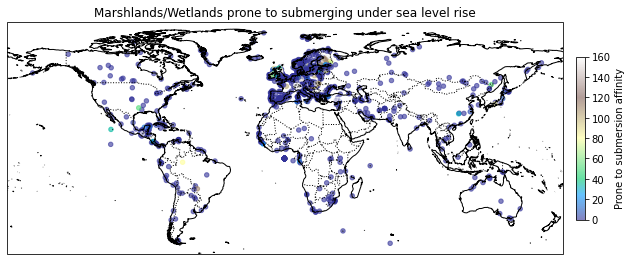

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Replace with the path to your .xls file
xls_file_path = 'ramsar-slr-august2013.xls'

# Specify the columns you want to read
columns_to_read = [
    "COUNTRY", "SITE_NAME", "LON_DD", "LAT_DD", "DOC_AREA_H", "GIS_AREA_H", "GIS_AREA_KM", 
    "MARINE_C", "SUBTIDAL", "INTERTIDAL", "ELEV_MIN", "ELEV_MAX", "ELEV_AVG", "COASTAL", 
    "RISK1", "RISK2", "PCTRISK1", "PCTRISK2", "AREA_0", "AREA_1", "AREA_2", "AREA_0_1KM", 
    "AREA_1_1KM", "AREA_2_1KM", "AREA_0_5KM", "AREA_1_5KM", "AREA_2_5KM", "PCTRISK_1_1KM", 
    "PCTRISK_2_1KM", "PCTRISK_1_5KM", "PCTRISK_2_5KM", "URBAN_EX", "URBAN_EX_1KM", 
    "MAX_PD", "MAX_PD_1KM", "MAX_PD_5KM", "AVG_PD", "AVG_PD_1KM", "AVG_PD_5KM", 
    "IMR2008", "IMR2008_1KM", "IMR2008_5KM"
]

# Read a specific sheet and only the specified columns
df_sheet = pd.read_excel(xls_file_path, sheet_name='Site Statistics', usecols=columns_to_read)

# Create a new DataFrame for the filtered rows
#df_filtered = df_sheet[df_sheet["COUNTRY"] == "UNITED STATES"].copy()

# Print the new filtered DataFrame
#print(df_filtered)

#quantile_range = df_filtered['ELEV_AVG'].quantile([0.05, 0.95])
quantile_range = df_sheet['ELEV_AVG'].quantile([0.05, 0.95])
vmin, vmax = quantile_range.values

fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})
#ax.set_extent([-125, -66.5, 24, 50], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND.with_scale('50m'), color='white')
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
'''sc = ax.scatter(df_filtered['LON_DD'], df_filtered['LAT_DD'], s=20,  # Increase the point size
                c=df_filtered['ELEV_AVG'], cmap='terrain',  # Use a terrain colormap
                alpha=0.6, vmin=vmin, vmax=vmax,  # Set alpha and color range
                transform=ccrs.PlateCarree())'''
sc = ax.scatter(df_sheet['LON_DD'], df_sheet['LAT_DD'], s=20,  # Increase the point size
                c=df_sheet['ELEV_AVG'], cmap='terrain',  # Use a terrain colormap
                alpha=0.6, vmin=vmin, vmax=vmax,  # Set alpha and color range
                transform=ccrs.PlateCarree())
cbar = plt.colorbar(sc, shrink=0.5, pad=0.02)
cbar.set_label('Prone to submersion affinity')
plt.title('Marshlands/Wetlands prone to submerging under sea level rise')
plt.savefig('Submerge.png')
plt.show()

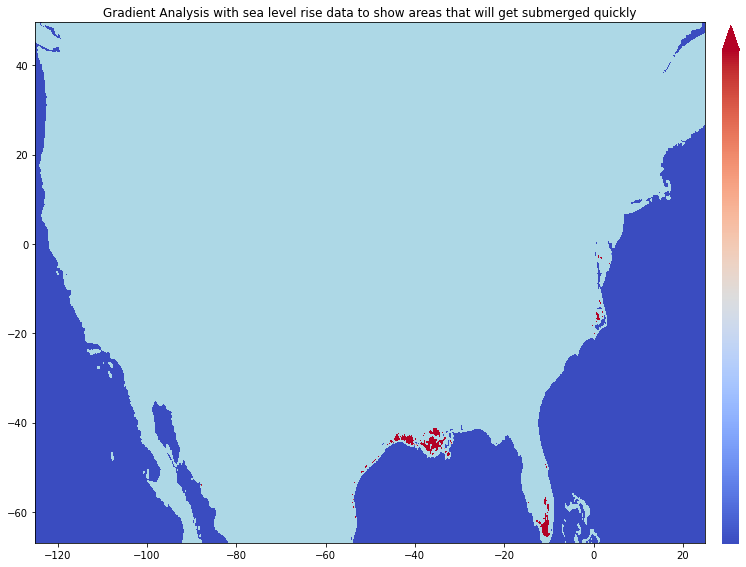

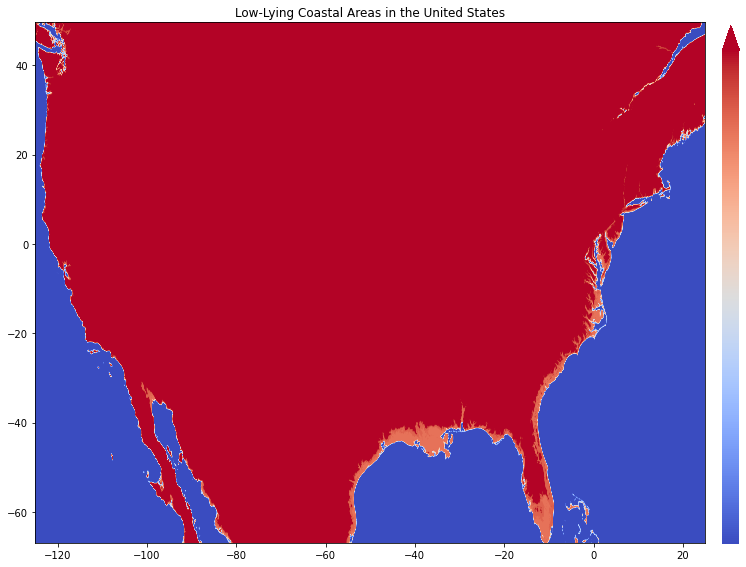

In [1]:
!pip install rasterio    
import rasterio
from rasterio.enums import Resampling
import matplotlib.pyplot as plt
import numpy as np

tif_path = 'lecz-urban-rural-population-land-area-estimates-v3-merit-leczs-geotiff/lecz_v3_spatial_data/data/merit_leczs.tif'
bbox = [-125.0011, 24.9493, -66.9326, 49.5904]  # Bounding box for the contiguous US

# Function to read and resample a raster file at a given overview level
def read_resampled_data(src, overview_level=0, bbox=None):
    # Calculate the window to read based on the bounding box and transform
    if bbox:
        window = rasterio.windows.from_bounds(*bbox, transform=src.transform)
    else:
        window = rasterio.windows.Window(0, 0, src.width, src.height)

    # Determine the read resolution based on the selected overview level
    ovr_factor = src.overviews(1)[overview_level]
    new_width = src.width // ovr_factor
    new_height = src.height // ovr_factor
    
    # Read the data from the window at the specified overview level
    data = src.read(1, window=window, out_shape=(new_height, new_width), resampling=Resampling.nearest)
    return data

with rasterio.open(tif_path) as src:
    # Select an appropriate overview level based on your memory capacity and detail needs
    overview_level = 2  # Adjust this based on available overview levels
    data = read_resampled_data(src, overview_level=overview_level, bbox=bbox)
    low_lying_threshold = 10
    data_normalized = np.where(data < low_lying_threshold, data, np.nan)

    # Visualization
    fig, ax = plt.subplots(figsize=(12, 12))
    cmap = plt.cm.get_cmap("coolwarm").copy()
    cmap.set_bad('lightblue')
    img = ax.imshow(data_normalized, cmap=cmap, extent=bbox)
    cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar = plt.colorbar(img, cax=cbar_ax, extend='max')
    cbar.set_label('Gradient of Submerging', rotation=270, labelpad=20)
    ax.set_title('Gradient Analysis with sea level rise data to show areas that will get submerged quickly')
    plt.axis('off')
    plt.savefig('Submerged_Quickly', format = 'png', facecolor='w', dpi=300, transparent=True, bbox_inches='tight')
    plt.show()
    
    fig, ax = plt.subplots(figsize=(12, 12))
    cmap = plt.cm.get_cmap("coolwarm").copy()
    cmap.set_bad('lightblue')
    img = ax.imshow(data, cmap=cmap, extent=bbox)
    cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar = plt.colorbar(img, cax=cbar_ax, extend='max')
    cbar.set_label('Elevation (m)', rotation=270, labelpad=20)
    ax.set_title('Low-Lying Coastal Areas in the United States')
    plt.axis('off')
    plt.savefig('Low_Lying_Coastal_Areas', format='png', dpi=300, facecolor='white', transparent=True, bbox_inches='tight')
    plt.show()
    

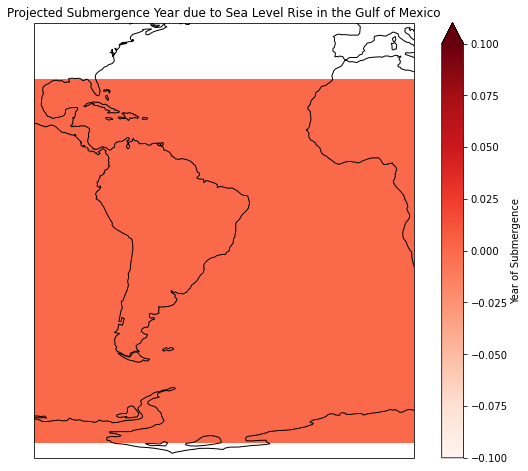

In [2]:
import concurrent.futures
import rasterio
from rasterio.plot import show
from rasterio.enums import Resampling
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs

# Equation parameters
slope = 4.9661009702696965
intercept = -9935.68757193266
a = -40.977446524748835
b = 6.269642503302494
d = 2.5

# Path to the TIFF file
tif_path = 'lecz-urban-rural-population-land-area-estimates-v3-merit-leczs-geotiff/lecz_v3_spatial_data/data/merit_leczs.tif'

# Gulf of Mexico bounds
bbox = [-100, 15, -80, 30]  # [min_lon, min_lat, max_lon, max_lat]

# Function to calculate the year of submergence based on elevation
def calculate_submergence_year(elevation, slope, intercept, a, b, d):
    # Solve for years_future in sea_levels_future = elevation
    # This requires solving for years_future in the given sea level rise equation set equal to elevation
    # The equation might not have a straightforward inverse, so we'll approximate the year of submergence
    # by iterating over a range of future years and finding when the sea level exceeds the elevation
    years_future = np.arange(0, 300)  # Assuming we check up to 300 years into the future
    sea_levels_future = slope * years_future + intercept + a * np.sin(b * years_future + d)
    for year, sea_level in zip(years_future, sea_levels_future):
        if sea_level >= elevation:
            return year
    return np.nan  # Return NaN if the elevation is not submerged within the considered timeframe

def calculate_submergence_year_parallel(elevation_chunk, slope, intercept, a, b, d, years_range):
    # Parallel version of calculate_submergence_year function that works on a chunk of elevation data
    sea_levels_future = slope * years_range[:, None, None] + intercept + a * np.sin(b * years_range[:, None, None] + d)
    submerged_year_idx = np.argmax(sea_levels_future >= elevation_chunk, axis=0)
    return years_range[submerged_year_idx]

# Prepare data for parallel processing
def process_in_parallel(elevation_data, slope, intercept, a, b, d, num_workers=3):
    years_range = np.arange(0, 300)
    # Split elevation data into chunks for parallel processing
    split_data = np.array_split(elevation_data, num_workers, axis=0)
    
    with concurrent.futures.ThreadPoolExecutor(max_workers=num_workers) as executor:
        futures = [executor.submit(calculate_submergence_year_parallel, chunk, slope, intercept, a, b, d, years_range) for chunk in split_data]
        results = np.concatenate([f.result() for f in concurrent.futures.as_completed(futures)], axis=0)
    return results

with rasterio.open(tif_path) as src:
    # Clip the raster to the Gulf of Mexico region
    window = rasterio.windows.from_bounds(*bbox, transform=src.transform)
    overview_level = 4
    ovr_factor = src.overviews(1)[overview_level]
    new_width = src.width // ovr_factor
    new_height = src.height // ovr_factor
    
    # Read the data from the window at the specified overview level
    elevation_data = src.read(1, window=window, out_shape=(new_height, new_width), resampling=Resampling.nearest)
    
    # Get the transform for the clipped region
    transform = src.window_transform(window)

# Calculate the year of submergence for each point
submergence_year = process_in_parallel(elevation_data, slope, intercept, a, b, d)

# Plotting
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
img = ax.imshow(submergence_year, extent=bbox, cmap='Reds', origin='upper', transform=ccrs.PlateCarree())
cbar = fig.colorbar(img, ax=ax, extend='max', label='Year of Submergence')
ax.set_title('Projected Submergence Year due to Sea Level Rise in the Gulf of Mexico')
ax.coastlines()
ax.set_extent(bbox)
#ax.set_xlim(15, 30)
#ax.set_ylim(-100, -80)

plt.show()